<a href="https://colab.research.google.com/github/daclemen/CEFR/blob/main/Copy1_of_Cuaderno_ML_2_1_b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install missing packages

In [1]:
!pip install scikit-plot

# Imports

In [2]:
import numpy as np
import pandas as pd
import missingno as msno
from matplotlib import pyplot as plt
import seaborn as sb
import time

from sklearn.pipeline      import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
#from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold, cross_val_score, cross_val_predict
from sklearn.metrics         import accuracy_score, balanced_accuracy_score, confusion_matrix
from sklearn.inspection      import permutation_importance
from sklearn.experimental import enable_hist_gradient_boosting
import scikitplot as skplt

########################################################### CLASSIFIERS

#### MULT
from sklearn.linear_model   import LogisticRegression
from sklearn.linear_model   import RidgeClassifier
from sklearn.svm            import SVC
from sklearn.svm            import NuSVC
from sklearn.svm            import LinearSVC
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors      import KNeighborsClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.naive_bayes    import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.ensemble       import StackingClassifier
from sklearn.dummy import DummyClassifier

#### TREE
from sklearn.tree          import DecisionTreeClassifier
from sklearn.ensemble      import RandomForestClassifier
from sklearn.ensemble      import ExtraTreesClassifier
from sklearn.ensemble      import AdaBoostClassifier
from sklearn.ensemble      import GradientBoostingClassifier
from sklearn.ensemble      import HistGradientBoostingClassifier
from xgboost               import XGBClassifier, plot_tree
from lightgbm              import LGBMClassifier
#from catboost              import CatBoostClassifier
#from ngboost               import NGBClassifier
#from rgf.sklearn           import RGFClassifier, FastRGFClassifier

########################################################### REGRESSORS
from sklearn.linear_model  import ElasticNet, Ridge, Lasso, BayesianRidge, ARDRegression, TweedieRegressor
from sklearn.svm           import LinearSVR, NuSVR, SVR
from sklearn.ensemble      import BaggingRegressor
from sklearn.kernel_ridge  import KernelRidge

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
sb.set_style("whitegrid")

/usr/local/lib/python3.10/dist-packages/sklearn/experimental/enable_hist_gradient_boosting.py:16: UserWarning: Since version 1.0, it is not needed to import enable_hist_gradient_boosting anymore. HistGradientBoostingClassifier and HistGradientBoostingRegressor are now stable and can be normally imported from sklearn.ensemble.
  warnings.warn(


# Read data

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
project_dir = "/content/drive/MyDrive/TAALES-TAASSC_data/"

In [ ]:
df_lex_simp = pd.read_csv(project_dir + "lexis.csv")
df_lex_comp = pd.read_csv(project_dir + "lexis_comp.csv")
df_syn_simp = pd.read_csv(project_dir + "syntax.csv")
df_syn_comp = pd.read_csv(project_dir + "syntax_comp.csv")
df_syn_sca = pd.read_csv(project_dir + "syntax_sca.csv")

In [ ]:
df_lex_simp.shape, df_lex_comp.shape, df_syn_simp.shape, df_syn_comp.shape, df_syn_sca.shape

((3798, 486), (3798, 353), (3798, 356), (3798, 10), (3798, 16))

My comp data from TAALES had an extra coma at the end of every line. Thus, I had to remove them manually

In [ ]:
df_lex_comp.head()

,Filename,cw_percentage,fw_percentage,KF_Freq_AW,KF_Freq_AW_Log,KF_Ncats_AW,KF_Nsamp_AW,TL_Freq_AW,TL_Freq_AW_Log,Brown_Freq_AW,Brown_Freq_AW_Log,KF_Freq_CW,KF_Freq_CW_Log,KF_Ncats_CW,KF_Nsamp_CW,TL_Freq_CW,TL_Freq_CW_Log,Brown_Freq_CW,Brown_Freq_CW_Log,KF_Freq_FW,KF_Freq_FW_Log,KF_Ncats_FW,KF_Nsamp_FW,TL_Freq_FW,TL_Freq_FW_Log,Brown_Freq_FW,Brown_Freq_FW_Log,MRC_Familiarity_AW,MRC_Concreteness_AW,MRC_Imageability_AW,MRC_Meaningfulness_AW,MRC_Familiarity_CW,MRC_Concreteness_CW,MRC_Imageability_CW,MRC_Familiarity_FW,MRC_Concreteness_FW,MRC_Imageability_FW,MRC_Meaningfulness_FW,Kuperman_AoA_AW,Kuperman_AoA_CW,Kuperman_AoA_FW,SUBTLEXus_Freq_AW,SUBTLEXus_Range_AW,SUBTLEXus_Freq_AW_Log,SUBTLEXus_Range_AW_Log,SUBTLEXus_Freq_CW,SUBTLEXus_Range_CW,SUBTLEXus_Freq_CW_Log,SUBTLEXus_Range_CW_Log,SUBTLEXus_Freq_FW,SUBTLEXus_Range_FW,SUBTLEXus_Freq_FW_Log,SUBTLEXus_Range_FW_Log,BNC_Written_Freq_AW,BNC_Written_Freq_AW_Log,BNC_Written_Range_AW,BNC_Spoken_Freq_AW,BNC_Spoken_Freq_AW_Log,BNC_Spoken_Range_AW,BNC_Written_Freq_CW,BNC_Written_Freq_CW_Log,BNC_Written_Range_CW,BNC_Spoken_Freq_CW,BNC_Spoken_Freq_CW_Log,BNC_Spoken_Range_CW,BNC_Written_Freq_FW,BNC_Written_Freq_FW_Log,BNC_Written_Range_FW,BNC_Spoken_Freq_FW,BNC_Spoken_Freq_FW_Log,BNC_Spoken_Range_FW,BNC_Spoken_Bigram_Normed_Freq,BNC_Spoken_Bigram_Normed_Freq_Log,BNC_Written_Bigram_Freq_Normed,BNC_Written_Bigram_Freq_Normed_Log,BNC_Spoken_Trigram_Normed_Freq,BNC_Spoken_Trigram_Normed_Freq_Log,BNC_Written_Trigram_Freq_Normed,BNC_Written_Trigram_Freq_Normed_Log,COCA_Academic_Range_AW,COCA_Academic_Frequency_AW,COCA_Academic_Range_Log_AW,COCA_Academic_Frequency_Log_AW,COCA_Academic_Range_CW,COCA_Academic_Frequency_CW,COCA_Academic_Range_Log_CW,COCA_Academic_Frequency_Log_CW,COCA_Academic_Range_FW,COCA_Academic_Frequency_FW,COCA_Academic_Range_Log_FW,COCA_Academic_Frequency_Log_FW,COCA_fiction_Range_AW,COCA_fiction_Frequency_AW,COCA_fiction_Range_Log_AW,COCA_fiction_Frequency_Log_AW,COCA_fiction_Range_CW,COCA_fiction_Frequency_CW,COCA_fiction_Range_Log_CW,COCA_fiction_Frequency_Log_CW,COCA_fiction_Range_FW,COCA_fiction_Frequency_FW,COCA_fiction_Range_Log_FW,COCA_fiction_Frequency_Log_FW,COCA_magazine_Range_AW,COCA_magazine_Frequency_AW,COCA_magazine_Range_Log_AW,COCA_magazine_Frequency_Log_AW,COCA_magazine_Range_CW,COCA_magazine_Frequency_CW,COCA_magazine_Range_Log_CW,COCA_magazine_Frequency_Log_CW,COCA_magazine_Range_FW,COCA_magazine_Frequency_FW,COCA_magazine_Range_Log_FW,COCA_magazine_Frequency_Log_FW,COCA_news_Range_AW,COCA_news_Frequency_AW,COCA_news_Range_Log_AW,COCA_news_Frequency_Log_AW,COCA_news_Range_CW,COCA_news_Frequency_CW,COCA_news_Range_Log_CW,COCA_news_Frequency_Log_CW,COCA_news_Range_FW,COCA_news_Frequency_FW,COCA_news_Range_Log_FW,COCA_news_Frequency_Log_FW,COCA_spoken_Range_AW,COCA_spoken_Frequency_AW,COCA_spoken_Range_Log_AW,COCA_spoken_Frequency_Log_AW,COCA_spoken_Range_CW,COCA_spoken_Frequency_CW,COCA_spoken_Range_Log_CW,COCA_spoken_Frequency_Log_CW,COCA_spoken_Range_FW,COCA_spoken_Frequency_FW,COCA_spoken_Range_Log_FW,COCA_spoken_Frequency_Log_FW,COCA_Academic_Bigram_Frequency,COCA_Academic_Bigram_Range,COCA_Academic_Bigram_Frequency_Log,COCA_Academic_Bigram_Range_Log,COCA_academic_bi_MI,COCA_academic_bi_MI2,COCA_academic_bi_T,COCA_academic_bi_DP,COCA_academic_bi_AC,COCA_Fiction_Bigram_Frequency,COCA_Fiction_Bigram_Range,COCA_Fiction_Bigram_Frequency_Log,COCA_Fiction_Bigram_Range_Log,COCA_fiction_bi_MI,COCA_fiction_bi_MI2,COCA_fiction_bi_T,COCA_fiction_bi_DP,COCA_fiction_bi_AC,COCA_Magazine_Bigram_Frequency,COCA_Magazine_Bigram_Range,COCA_Magazine_Bigram_Frequency_Log,COCA_Magazine_Bigram_Range_Log,COCA_magazine_bi_MI,COCA_magazine_bi_MI2,COCA_magazine_bi_T,COCA_magazine_bi_DP,COCA_magazine_bi_AC,COCA_News_Bigram_Frequency,COCA_News_Bigram_Range,COCA_News_Bigram_Frequency_Log,COCA_News_Bigram_Range_Log,COCA_news_bi_MI,COCA_news_bi_MI2,COCA_news_bi_T,COCA_news_bi_DP,COCA_news_bi_AC,COCA_spoken_Bigram_Frequency,COCA_spoken_Bigram_Range,COCA_spoken_Bigram_Frequency_Log,COCA

I rename the column "Filename" to "filename" in these 2 dfs

In [ ]:
# Rename 'Filename' to 'filename' in df_lex_simp
df_lex_simp.rename(columns={'Filename': 'filename'}, inplace=True)

# Rename 'Filename' to 'filename' in df_lex_comp
df_lex_comp.rename(columns={'Filename': 'filename'}, inplace=True)


In [ ]:
# Convert 'filename' column to string type
df_lex_comp['filename'] = df_lex_comp['filename'].astype(str)
df_lex_simp['filename'] = df_lex_simp['filename'].astype(str)
df_syn_comp['filename'] = df_syn_comp['filename'].astype(str)
df_syn_simp['filename'] = df_syn_simp['filename'].astype(str)
df_syn_sca['filename'] = df_syn_simp['filename'].astype(str)

Here, I extract the CEFR level tag from the filename column of each df

In [ ]:
df_lex_simp['CEFR'] = df_lex_simp['filename'].str.extract('(A2|B1_1|B1_2|B2)')
df_lex_comp['CEFR'] = df_lex_comp['filename'].str.extract('(A2|B1_1|B1_2|B2)')
df_syn_simp['CEFR'] = df_syn_simp['filename'].str.extract('(A2|B1_1|B1_2|B2)')
df_syn_comp['CEFR'] = df_syn_comp['filename'].str.extract('(A2|B1_1|B1_2|B2)')
df_syn_sca['CEFR'] = df_syn_sca['filename'].str.extract('(A2|B1_1|B1_2|B2)')

In [ ]:
df_lex_comp.head()

,filename,cw_percentage,fw_percentage,KF_Freq_AW,KF_Freq_AW_Log,KF_Ncats_AW,KF_Nsamp_AW,TL_Freq_AW,TL_Freq_AW_Log,Brown_Freq_AW,Brown_Freq_AW_Log,KF_Freq_CW,KF_Freq_CW_Log,KF_Ncats_CW,KF_Nsamp_CW,TL_Freq_CW,TL_Freq_CW_Log,Brown_Freq_CW,Brown_Freq_CW_Log,KF_Freq_FW,KF_Freq_FW_Log,KF_Ncats_FW,KF_Nsamp_FW,TL_Freq_FW,TL_Freq_FW_Log,Brown_Freq_FW,Brown_Freq_FW_Log,MRC_Familiarity_AW,MRC_Concreteness_AW,MRC_Imageability_AW,MRC_Meaningfulness_AW,MRC_Familiarity_CW,MRC_Concreteness_CW,MRC_Imageability_CW,MRC_Familiarity_FW,MRC_Concreteness_FW,MRC_Imageability_FW,MRC_Meaningfulness_FW,Kuperman_AoA_AW,Kuperman_AoA_CW,Kuperman_AoA_FW,SUBTLEXus_Freq_AW,SUBTLEXus_Range_AW,SUBTLEXus_Freq_AW_Log,SUBTLEXus_Range_AW_Log,SUBTLEXus_Freq_CW,SUBTLEXus_Range_CW,SUBTLEXus_Freq_CW_Log,SUBTLEXus_Range_CW_Log,SUBTLEXus_Freq_FW,SUBTLEXus_Range_FW,SUBTLEXus_Freq_FW_Log,SUBTLEXus_Range_FW_Log,BNC_Written_Freq_AW,BNC_Written_Freq_AW_Log,BNC_Written_Range_AW,BNC_Spoken_Freq_AW,BNC_Spoken_Freq_AW_Log,BNC_Spoken_Range_AW,BNC_Written_Freq_CW,BNC_Written_Freq_CW_Log,BNC_Written_Range_CW,BNC_Spoken_Freq_CW,BNC_Spoken_Freq_CW_Log,BNC_Spoken_Range_CW,BNC_Written_Freq_FW,BNC_Written_Freq_FW_Log,BNC_Written_Range_FW,BNC_Spoken_Freq_FW,BNC_Spoken_Freq_FW_Log,BNC_Spoken_Range_FW,BNC_Spoken_Bigram_Normed_Freq,BNC_Spoken_Bigram_Normed_Freq_Log,BNC_Written_Bigram_Freq_Normed,BNC_Written_Bigram_Freq_Normed_Log,BNC_Spoken_Trigram_Normed_Freq,BNC_Spoken_Trigram_Normed_Freq_Log,BNC_Written_Trigram_Freq_Normed,BNC_Written_Trigram_Freq_Normed_Log,COCA_Academic_Range_AW,COCA_Academic_Frequency_AW,COCA_Academic_Range_Log_AW,COCA_Academic_Frequency_Log_AW,COCA_Academic_Range_CW,COCA_Academic_Frequency_CW,COCA_Academic_Range_Log_CW,COCA_Academic_Frequency_Log_CW,COCA_Academic_Range_FW,COCA_Academic_Frequency_FW,COCA_Academic_Range_Log_FW,COCA_Academic_Frequency_Log_FW,COCA_fiction_Range_AW,COCA_fiction_Frequency_AW,COCA_fiction_Range_Log_AW,COCA_fiction_Frequency_Log_AW,COCA_fiction_Range_CW,COCA_fiction_Frequency_CW,COCA_fiction_Range_Log_CW,COCA_fiction_Frequency_Log_CW,COCA_fiction_Range_FW,COCA_fiction_Frequency_FW,COCA_fiction_Range_Log_FW,COCA_fiction_Frequency_Log_FW,COCA_magazine_Range_AW,COCA_magazine_Frequency_AW,COCA_magazine_Range_Log_AW,COCA_magazine_Frequency_Log_AW,COCA_magazine_Range_CW,COCA_magazine_Frequency_CW,COCA_magazine_Range_Log_CW,COCA_magazine_Frequency_Log_CW,COCA_magazine_Range_FW,COCA_magazine_Frequency_FW,COCA_magazine_Range_Log_FW,COCA_magazine_Frequency_Log_FW,COCA_news_Range_AW,COCA_news_Frequency_AW,COCA_news_Range_Log_AW,COCA_news_Frequency_Log_AW,COCA_news_Range_CW,COCA_news_Frequency_CW,COCA_news_Range_Log_CW,COCA_news_Frequency_Log_CW,COCA_news_Range_FW,COCA_news_Frequency_FW,COCA_news_Range_Log_FW,COCA_news_Frequency_Log_FW,COCA_spoken_Range_AW,COCA_spoken_Frequency_AW,COCA_spoken_Range_Log_AW,COCA_spoken_Frequency_Log_AW,COCA_spoken_Range_CW,COCA_spoken_Frequency_CW,COCA_spoken_Range_Log_CW,COCA_spoken_Frequency_Log_CW,COCA_spoken_Range_FW,COCA_spoken_Frequency_FW,COCA_spoken_Range_Log_FW,COCA_spoken_Frequency_Log_FW,COCA_Academic_Bigram_Frequency,COCA_Academic_Bigram_Range,COCA_Academic_Bigram_Frequency_Log,COCA_Academic_Bigram_Range_Log,COCA_academic_bi_MI,COCA_academic_bi_MI2,COCA_academic_bi_T,COCA_academic_bi_DP,COCA_academic_bi_AC,COCA_Fiction_Bigram_Frequency,COCA_Fiction_Bigram_Range,COCA_Fiction_Bigram_Frequency_Log,COCA_Fiction_Bigram_Range_Log,COCA_fiction_bi_MI,COCA_fiction_bi_MI2,COCA_fiction_bi_T,COCA_fiction_bi_DP,COCA_fiction_bi_AC,COCA_Magazine_Bigram_Frequency,COCA_Magazine_Bigram_Range,COCA_Magazine_Bigram_Frequency_Log,COCA_Magazine_Bigram_Range_Log,COCA_magazine_bi_MI,COCA_magazine_bi_MI2,COCA_magazine_bi_T,COCA_magazine_bi_DP,COCA_magazine_bi_AC,COCA_News_Bigram_Frequency,COCA_News_Bigram_Range,COCA_News_Bigram_Frequency_Log,COCA_News_Bigram_Range_Log,COCA_news_bi_MI,COCA_news_bi_MI2,COCA_news_bi_T,COCA_news_bi_DP,COCA_news_bi_AC,COCA_spoken_Bigram_Frequency,COCA_spoken_Bigram_Range,COCA_spoken_Bigram_Frequency_Log,COCA

In [ ]:
df_lex_simp.shape, df_lex_comp.shape, df_syn_simp.shape, df_syn_comp.shape, df_syn_sca.shape

((3798, 487), (3798, 354), (3798, 357), (3798, 11), (3798, 17))

In [ ]:
df_lex_simp.CEFR.value_counts()

CEFR
B1_2    1875
B1_1     883
B2       640
A2       400
Name: count, dtype: int64

I had to merge instead of concatenating due to the duplication of some characteristics

In [ ]:
y = df_lex_simp["CEFR"]

# Drop the unnecessary columns
x_lex_simp = df_lex_simp.drop(columns=["filename", "Word Count", "CEFR"])
x_lex_comp = df_lex_comp.drop(columns=["filename", "CEFR"])

x_lex_simp_comp = pd.concat([x_lex_simp, x_lex_comp], axis=1)

x_syn_simp = df_syn_simp.drop(columns=["filename", "nwords", "CEFR"])
x_syn_comp = df_syn_comp.drop(columns=["filename", "CEFR"])
x_syn_sca = df_syn_sca.drop(columns=["filename", "nwords", "CEFR"])

x_syn_simp_comp = pd.concat([x_syn_simp, x_syn_comp, x_syn_sca], axis=1)


In [ ]:
df_lex_comp.head()

,filename,cw_percentage,fw_percentage,KF_Freq_AW,KF_Freq_AW_Log,KF_Ncats_AW,KF_Nsamp_AW,TL_Freq_AW,TL_Freq_AW_Log,Brown_Freq_AW,Brown_Freq_AW_Log,KF_Freq_CW,KF_Freq_CW_Log,KF_Ncats_CW,KF_Nsamp_CW,TL_Freq_CW,TL_Freq_CW_Log,Brown_Freq_CW,Brown_Freq_CW_Log,KF_Freq_FW,KF_Freq_FW_Log,KF_Ncats_FW,KF_Nsamp_FW,TL_Freq_FW,TL_Freq_FW_Log,Brown_Freq_FW,Brown_Freq_FW_Log,MRC_Familiarity_AW,MRC_Concreteness_AW,MRC_Imageability_AW,MRC_Meaningfulness_AW,MRC_Familiarity_CW,MRC_Concreteness_CW,MRC_Imageability_CW,MRC_Familiarity_FW,MRC_Concreteness_FW,MRC_Imageability_FW,MRC_Meaningfulness_FW,Kuperman_AoA_AW,Kuperman_AoA_CW,Kuperman_AoA_FW,SUBTLEXus_Freq_AW,SUBTLEXus_Range_AW,SUBTLEXus_Freq_AW_Log,SUBTLEXus_Range_AW_Log,SUBTLEXus_Freq_CW,SUBTLEXus_Range_CW,SUBTLEXus_Freq_CW_Log,SUBTLEXus_Range_CW_Log,SUBTLEXus_Freq_FW,SUBTLEXus_Range_FW,SUBTLEXus_Freq_FW_Log,SUBTLEXus_Range_FW_Log,BNC_Written_Freq_AW,BNC_Written_Freq_AW_Log,BNC_Written_Range_AW,BNC_Spoken_Freq_AW,BNC_Spoken_Freq_AW_Log,BNC_Spoken_Range_AW,BNC_Written_Freq_CW,BNC_Written_Freq_CW_Log,BNC_Written_Range_CW,BNC_Spoken_Freq_CW,BNC_Spoken_Freq_CW_Log,BNC_Spoken_Range_CW,BNC_Written_Freq_FW,BNC_Written_Freq_FW_Log,BNC_Written_Range_FW,BNC_Spoken_Freq_FW,BNC_Spoken_Freq_FW_Log,BNC_Spoken_Range_FW,BNC_Spoken_Bigram_Normed_Freq,BNC_Spoken_Bigram_Normed_Freq_Log,BNC_Written_Bigram_Freq_Normed,BNC_Written_Bigram_Freq_Normed_Log,BNC_Spoken_Trigram_Normed_Freq,BNC_Spoken_Trigram_Normed_Freq_Log,BNC_Written_Trigram_Freq_Normed,BNC_Written_Trigram_Freq_Normed_Log,COCA_Academic_Range_AW,COCA_Academic_Frequency_AW,COCA_Academic_Range_Log_AW,COCA_Academic_Frequency_Log_AW,COCA_Academic_Range_CW,COCA_Academic_Frequency_CW,COCA_Academic_Range_Log_CW,COCA_Academic_Frequency_Log_CW,COCA_Academic_Range_FW,COCA_Academic_Frequency_FW,COCA_Academic_Range_Log_FW,COCA_Academic_Frequency_Log_FW,COCA_fiction_Range_AW,COCA_fiction_Frequency_AW,COCA_fiction_Range_Log_AW,COCA_fiction_Frequency_Log_AW,COCA_fiction_Range_CW,COCA_fiction_Frequency_CW,COCA_fiction_Range_Log_CW,COCA_fiction_Frequency_Log_CW,COCA_fiction_Range_FW,COCA_fiction_Frequency_FW,COCA_fiction_Range_Log_FW,COCA_fiction_Frequency_Log_FW,COCA_magazine_Range_AW,COCA_magazine_Frequency_AW,COCA_magazine_Range_Log_AW,COCA_magazine_Frequency_Log_AW,COCA_magazine_Range_CW,COCA_magazine_Frequency_CW,COCA_magazine_Range_Log_CW,COCA_magazine_Frequency_Log_CW,COCA_magazine_Range_FW,COCA_magazine_Frequency_FW,COCA_magazine_Range_Log_FW,COCA_magazine_Frequency_Log_FW,COCA_news_Range_AW,COCA_news_Frequency_AW,COCA_news_Range_Log_AW,COCA_news_Frequency_Log_AW,COCA_news_Range_CW,COCA_news_Frequency_CW,COCA_news_Range_Log_CW,COCA_news_Frequency_Log_CW,COCA_news_Range_FW,COCA_news_Frequency_FW,COCA_news_Range_Log_FW,COCA_news_Frequency_Log_FW,COCA_spoken_Range_AW,COCA_spoken_Frequency_AW,COCA_spoken_Range_Log_AW,COCA_spoken_Frequency_Log_AW,COCA_spoken_Range_CW,COCA_spoken_Frequency_CW,COCA_spoken_Range_Log_CW,COCA_spoken_Frequency_Log_CW,COCA_spoken_Range_FW,COCA_spoken_Frequency_FW,COCA_spoken_Range_Log_FW,COCA_spoken_Frequency_Log_FW,COCA_Academic_Bigram_Frequency,COCA_Academic_Bigram_Range,COCA_Academic_Bigram_Frequency_Log,COCA_Academic_Bigram_Range_Log,COCA_academic_bi_MI,COCA_academic_bi_MI2,COCA_academic_bi_T,COCA_academic_bi_DP,COCA_academic_bi_AC,COCA_Fiction_Bigram_Frequency,COCA_Fiction_Bigram_Range,COCA_Fiction_Bigram_Frequency_Log,COCA_Fiction_Bigram_Range_Log,COCA_fiction_bi_MI,COCA_fiction_bi_MI2,COCA_fiction_bi_T,COCA_fiction_bi_DP,COCA_fiction_bi_AC,COCA_Magazine_Bigram_Frequency,COCA_Magazine_Bigram_Range,COCA_Magazine_Bigram_Frequency_Log,COCA_Magazine_Bigram_Range_Log,COCA_magazine_bi_MI,COCA_magazine_bi_MI2,COCA_magazine_bi_T,COCA_magazine_bi_DP,COCA_magazine_bi_AC,COCA_News_Bigram_Frequency,COCA_News_Bigram_Range,COCA_News_Bigram_Frequency_Log,COCA_News_Bigram_Range_Log,COCA_news_bi_MI,COCA_news_bi_MI2,COCA_news_bi_T,COCA_news_bi_DP,COCA_news_bi_AC,COCA_spoken_Bigram_Frequency,COCA_spoken_Bigram_Range,COCA_spoken_Bigram_Frequency_Log,COCA

In [ ]:
x_lex_simp_comp.shape

(3798, 836)

# <center> Experiment I Lexical Data

In [ ]:
#df_lex_simp.columns.values
x_lex_simp_comp.head()

,KF_Freq_AW,KF_Freq_AW_Log,KF_Ncats_AW,KF_Nsamp_AW,TL_Freq_AW,TL_Freq_AW_Log,Brown_Freq_AW,Brown_Freq_AW_Log,KF_Freq_CW,KF_Freq_CW_Log,KF_Ncats_CW,KF_Nsamp_CW,TL_Freq_CW,TL_Freq_CW_Log,Brown_Freq_CW,Brown_Freq_CW_Log,KF_Freq_FW,KF_Freq_FW_Log,KF_Ncats_FW,KF_Nsamp_FW,TL_Freq_FW,TL_Freq_FW_Log,Brown_Freq_FW,Brown_Freq_FW_Log,MRC_Familiarity_AW,MRC_Concreteness_AW,MRC_Imageability_AW,MRC_Meaningfulness_AW,MRC_Familiarity_CW,MRC_Concreteness_CW,MRC_Imageability_CW,MRC_Familiarity_FW,MRC_Concreteness_FW,MRC_Imageability_FW,MRC_Meaningfulness_FW,Kuperman_AoA_AW,Kuperman_AoA_CW,Kuperman_AoA_FW,Brysbaert_Concreteness_Combined_AW,Brysbaert_Concreteness_Combined_CW,Brysbaert_Concreteness_Combined_FW,SUBTLEXus_Freq_AW,SUBTLEXus_Range_AW,SUBTLEXus_Freq_AW_Log,SUBTLEXus_Range_AW_Log,SUBTLEXus_Freq_CW,SUBTLEXus_Range_CW,SUBTLEXus_Freq_CW_Log,SUBTLEXus_Range_CW_Log,SUBTLEXus_Freq_FW,SUBTLEXus_Range_FW,SUBTLEXus_Freq_FW_Log,SUBTLEXus_Range_FW_Log,BNC_Written_Freq_AW,BNC_Written_Freq_AW_Log,BNC_Written_Range_AW,BNC_Spoken_Freq_AW,BNC_Spoken_Freq_AW_Log,BNC_Spoken_Range_AW,BNC_Written_Freq_CW,BNC_Written_Freq_CW_Log,BNC_Written_Range_CW,BNC_Spoken_Freq_CW,BNC_Spoken_Freq_CW_Log,BNC_Spoken_Range_CW,BNC_Written_Freq_FW,BNC_Written_Freq_FW_Log,BNC_Written_Range_FW,BNC_Spoken_Freq_FW,BNC_Spoken_Freq_FW_Log,BNC_Spoken_Range_FW,BNC_Spoken_Bigram_Normed_Freq,BNC_Spoken_Bigram_Normed_Freq_Log,BNC_Written_Bigram_Freq_Normed,BNC_Written_Bigram_Freq_Normed_Log,BNC_Spoken_Trigram_Normed_Freq,BNC_Spoken_Trigram_Normed_Freq_Log,BNC_Written_Trigram_Freq_Normed,BNC_Written_Trigram_Freq_Normed_Log,BNC_Spoken_Bigram_Proportion,BNC_Written_Bigram_Proportion,BNC_Spoken_Trigram_Proportion,BNC_Written_Trigram_Proportion,COCA_Academic_Range_AW,COCA_Academic_Frequency_AW,COCA_Academic_Range_Log_AW,COCA_Academic_Frequency_Log_AW,COCA_Academic_Range_CW,COCA_Academic_Frequency_CW,COCA_Academic_Range_Log_CW,COCA_Academic_Frequency_Log_CW,COCA_Academic_Range_FW,COCA_Academic_Frequency_FW,COCA_Academic_Range_Log_FW,COCA_Academic_Frequency_Log_FW,COCA_fiction_Range_AW,COCA_fiction_Frequency_AW,COCA_fiction_Range_Log_AW,COCA_fiction_Frequency_Log_AW,COCA_fiction_Range_CW,COCA_fiction_Frequency_CW,COCA_fiction_Range_Log_CW,COCA_fiction_Frequency_Log_CW,COCA_fiction_Range_FW,COCA_fiction_Frequency_FW,COCA_fiction_Range_Log_FW,COCA_fiction_Frequency_Log_FW,COCA_magazine_Range_AW,COCA_magazine_Frequency_AW,COCA_magazine_Range_Log_AW,COCA_magazine_Frequency_Log_AW,COCA_magazine_Range_CW,COCA_magazine_Frequency_CW,COCA_magazine_Range_Log_CW,COCA_magazine_Frequency_Log_CW,COCA_magazine_Range_FW,COCA_magazine_Frequency_FW,COCA_magazine_Range_Log_FW,COCA_magazine_Frequency_Log_FW,COCA_news_Range_AW,COCA_news_Frequency_AW,COCA_news_Range_Log_AW,COCA_news_Frequency_Log_AW,COCA_news_Range_CW,COCA_news_Frequency_CW,COCA_news_Range_Log_CW,COCA_news_Frequency_Log_CW,COCA_news_Range_FW,COCA_news_Frequency_FW,COCA_news_Range_Log_FW,COCA_news_Frequency_Log_FW,COCA_spoken_Range_AW,COCA_spoken_Frequency_AW,COCA_spoken_Range_Log_AW,COCA_spoken_Frequency_Log_AW,COCA_spoken_Range_CW,COCA_spoken_Frequency_CW,COCA_spoken_Range_Log_CW,COCA_spoken_Frequency_Log_CW,COCA_spoken_Range_FW,COCA_spoken_Frequency_FW,COCA_spoken_Range_Log_FW,COCA_spoken_Frequency_Log_FW,COCA_Academic_Bigram_Frequency,COCA_Academic_Bigram_Range,COCA_Academic_Bigram_Frequency_Log,COCA_Academic_Bigram_Range_Log,COCA_academic_bi_MI,COCA_academic_bi_MI2,COCA_academic_bi_T,COCA_academic_bi_DP,COCA_academic_bi_AC,COCA_academic_bi_prop_10k,COCA_academic_bi_prop_20k,COCA_academic_bi_prop_30k,COCA_academic_bi_prop_40k,COCA_academic_bi_prop_50k,COCA_academic_bi_prop_60k,COCA_academic_bi_prop_70k,COCA_academic_bi_prop_80k,COCA_academic_bi_prop_90k,COCA_academic_bi_prop_100k,COCA_Fiction_Bigram_Frequency,COCA_Fiction_Bigram_Range,COCA_Fiction_Bigram_Frequency_Log,COCA_Fiction_Bigram_Range_Log,COCA_fiction_bi_MI,COCA_fiction_bi_MI2,COCA_fiction_bi_T,COCA_fiction_bi_DP,COCA_fiction_bi_AC,COCA_fiction_bi_prop_10k,COCA_fiction_bi_prop_20k,COCA

In [4]:
mult_classifiers = {
  #"Stacking":           StackingClassifier(estimators=ensemble2, final_estimator=LogisticRegression()),
  "LogRegr l1 liblin":  LogisticRegression(penalty='l1', solver='liblinear', tol=1e-6, max_iter=int(1e6), warm_start=True, intercept_scaling=10000.),
  "LogRegr l2 lbfgs":   LogisticRegression(penalty='l2', solver='lbfgs', n_jobs=-1),
  "LogRegr l1 saga":    LogisticRegression(penalty='l1', solver='saga', tol=0.01, n_jobs=-1),
  "LogRegr l2 saga":    LogisticRegression(penalty='l2', solver='saga', tol=0.01, n_jobs=-1),
  "LogRegr elasticnet": LogisticRegression(penalty='elasticnet', solver='saga', l1_ratio=0.5, tol=0.01, n_jobs=-1),
  "Ridge 1.":           RidgeClassifier(alpha=1.),
  "Ridge .5":           RidgeClassifier(alpha=.5),
  "Ridge .1":           RidgeClassifier(alpha=.1),
  "Ridge .01":          RidgeClassifier(alpha=.01),
  "Ridge .001":         RidgeClassifier(alpha=.001),
  "Ridge .0001":        RidgeClassifier(alpha=.0001),
  "Ridge .00001":       RidgeClassifier(alpha=.00001),
  "SVM_lin":            SVC(kernel="linear", C=0.025),
  "SVM_rbf":            SVC(kernel='rbf'),
  "NuSVC_rbf":          NuSVC(nu = 0.01),
  "NuSVC_lin":          NuSVC(nu = 0.01, kernel="linear"),
  "LinearSVC":          LinearSVC(),
  "KNN3":               KNeighborsClassifier(3),
  "KNN5":               KNeighborsClassifier(5),
# "GP":                 GaussianProcessClassifier(1.0 * RBF(1.0)),
  "GaussianNB":         GaussianNB()
}

mult_classifiers = {name: make_pipeline(StandardScaler(), model) for name, model in mult_classifiers.items()}

tree_classifiers = {
  "Decision Tree": DecisionTreeClassifier(),
  "Extra Trees":   ExtraTreesClassifier(n_estimators=100, n_jobs=-1),
  "Random Forest": RandomForestClassifier(n_estimators=100, n_jobs=-1),
# "AdaBoost":      AdaBoostClassifier(n_estimators=100),
# "Skl GBM":       GradientBoostingClassifier(n_estimators=100),
# "Skl HistGBM":   HistGradientBoostingClassifier(),
  "XGBoost":       XGBClassifier(n_estimators=100, n_jobs=-1),
  "LightGBM":      LGBMClassifier(n_estimators=100, n_jobs=-1),
# "CatBoost":      CatBoostClassifier(n_estimators=100),
# "NGBoost":       NGBClassifier(n_estimators=100),
# "RGF":           RGFClassifier(n_jobs=-1),
# "FastRGF":       FastRGFClassifier())
}
dummy_classifier = {
    "Dummy_classifier": DummyClassifier()
}

In [5]:
models = {**mult_classifiers, **tree_classifiers, **dummy_classifier}

In [6]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)

NameError: name 'y' is not defined

In [ ]:
print(f'Length of y: {len(y)}')
print(f'Number of samples in x_lex_simp_comp: {x_lex_simp_comp.shape[0]}')

# Ensure they are the same
assert len(y) == x_lex_simp_comp.shape[0], "The number of samples in X and y must be the same"


Length of y: 3798
Number of samples in x_lex_simp_comp: 3798


In [ ]:
duplicate_columns = x_lex_simp_comp.columns[x_lex_simp_comp.columns.duplicated()]
duplicate_columns

Index(['KF_Freq_AW', 'KF_Freq_AW_Log', 'KF_Ncats_AW', 'KF_Nsamp_AW',
       'TL_Freq_AW', 'TL_Freq_AW_Log', 'Brown_Freq_AW', 'Brown_Freq_AW_Log',
       'KF_Freq_CW', 'KF_Freq_CW_Log',
       ...
       'poly_noun', 'poly_verb', 'poly_adj', 'poly_adv', 'hyper_noun_S1_P1',
       'hyper_noun_Sav_P1', 'hyper_noun_Sav_Pav', 'hyper_verb_S1_P1',
       'hyper_verb_Sav_P1', 'hyper_verb_Sav_Pav'],
      dtype='object', length=350)

In [ ]:
x_lex_simp_comp = x_lex_simp_comp.loc[:,~x_lex_simp_comp.columns.duplicated()].copy()

In [ ]:
from IPython.display import clear_output

preds = {}
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
results = pd.DataFrame({'Model': [], 'Accuracy': [], 'Bal Acc.': [], 'Time': []})

for name, model in models.items():
    #cv_r = cross_val_score(model, x, y, cv=skf, scoring='accuracy')

    start_time = time.time()
    pred = cross_val_predict(model, x_lex_simp_comp, y, cv=skf)
    total_time = time.time() - start_time

    preds[name] = pred
    results = pd.concat([results, pd.DataFrame({"Model": [name],
                                                "Accuracy": [accuracy_score(y, pred)*100],
                                                "Bal Acc.": [balanced_accuracy_score(y, pred)*100],
                                                "Time": [total_time]})], ignore_index=True)

    results_ord = results.sort_values(by=['Bal Acc.'], ascending=False, ignore_index=True)
    results_ord.index += 1

    clear_output(wait=True)
    #display(results_ord.style.background_gradient(subset=['Accuracy', "Bal Acc.", 'Time'], cmap='Greens'))
    display(results_ord.style.bar(subset=['Accuracy', 'Bal Acc.'], vmin=0, vmax=100, color='#5fba7d'))

,Model,Accuracy,Bal Acc.,Time
1,NuSVC_rbf,54.291732,45.158570,28.448888
2,KNN3,45.576619,36.813977,1.993482
3,LogRegr l2 lbfgs,48.578199,36.706374,7.500763
4,LinearSVC,48.288573,36.403396,97.436463
5,LogRegr l1 liblin,49.868352,35.563791,276.402680
6,XGBoost,52.369668,34.775667,259.854184
7,Ridge .5,49.605055,34.709521,0.862220
8,Ridge .01,49.289100,34.708834,1.240267
9,Ridge 1.,49.947341,34.698521,0.843314
10,GaussianNB,30.700369,34.693117,0.335725


In [ ]:
y_pred = le.inverse_transform(y)

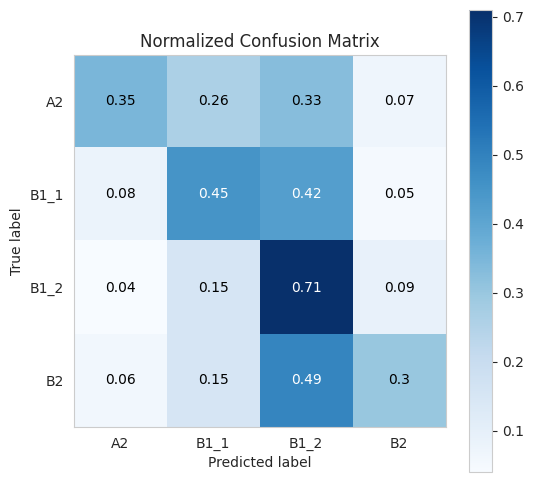

In [ ]:
skplt.metrics.plot_confusion_matrix(y_pred, le.inverse_transform(preds["NuSVC_rbf"]), normalize=True, hide_zeros=True, figsize=(6, 6));

In [ ]:
preds_str = {model:le.inverse_transform(pred) for model, pred in preds.items()}

In [ ]:
preds_df = pd.DataFrame(preds_str)
preds_df["Target"] = y_pred
preds_df.head()

,LogRegr l1 liblin,LogRegr l2 lbfgs,LogRegr l1 saga,LogRegr l2 saga,LogRegr elasticnet,Ridge 1.,Ridge .5,Ridge .1,Ridge .01,Ridge .001,Ridge .0001,Ridge .00001,SVM_lin,SVM_rbf,NuSVC_rbf,NuSVC_lin,LinearSVC,KNN3,KNN5,GaussianNB,Decision Tree,Extra Trees,Random Forest,XGBoost,LightGBM,Dummy_classifier,Target
0,B1_1,A2,B1_2,B1_2,B1_2,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_2,B1_2,B1_2,A2,A2,B1_2,B1_2,B2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2
1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_2,B1_2,B2,B1_1,B1_1,B1_2,B1_2,B1_1,B1_2,B1_2,B1_2,B1_1,B1_2,B1_2
2,B1_1,B1_1,B1_2,B1_2,B1_2,B1_1,B1_1,B1_1,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_1,B1_1,B1_1,B1_2,B1_2,B2,A2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_1
3,B1_1,A2,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_2,B1_2,A2,B1_1,B1_2,B1_2,A2,B1_1,B1_1,B1_2,B1_1,B1_1,B1_2,B1_2
4,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_2,B1_1,B1_1,B1_1,B1_2,B1_2,A2,B1_1,B1_2,B1_2,B1_2,B1_2,B1_2,B1_1


In [ ]:
def categ_corr(df):
    corr = pd.DataFrame()
    for a in list(df.columns.values):
        for b in list(df.columns.values):
            corr.loc[a, b] = (df[a]==df[b]).sum()/len(df)
    return corr

ccorr = categ_corr(preds_df)

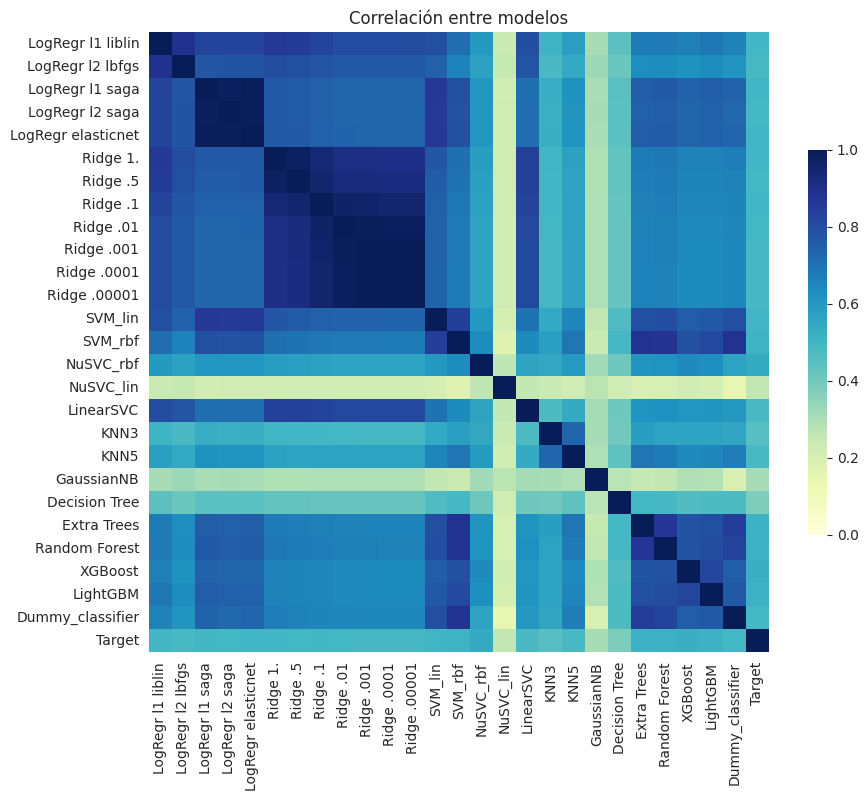

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
sb.heatmap(
    ccorr,
    #mask=np.triu(np.ones_like(ccorr, dtype=np.bool)),
    vmin=0, vmax=1,
    cmap="YlGnBu",#sb.diverging_palette(20, 220, n=200),
    square=True,
    #linewidths=.4,
    cbar_kws={"shrink": .5},
    #annot=True, fmt=".0%"
).set_title("Correlación entre modelos");

# <center> Interpretability

## Linear models: `coef_` & `intercept_`

In [ ]:
ridge = RidgeClassifier(alpha=1.)
ridge.fit(x_lex_simp_comp,y)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=3.61668e-17): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


RidgeClassifier()

In [ ]:
labels = le.inverse_transform(ridge.classes_)

In [ ]:
coef_df = pd.DataFrame(np.transpose(ridge.coef_), index=x_lex_simp_comp.columns, columns=labels)
coef_df["General"] = coef_df.abs().sum(axis=1)
coef_df

,A2,B1_1,B1_2,B2,General
KF_Freq_AW,2.333407e-04,-1.414477e-04,2.297454e-04,-3.216384e-04,0.000926
KF_Freq_AW_Log,-8.254912e-02,2.968624e-01,2.567456e-01,-4.710589e-01,1.107216
KF_Ncats_AW,-3.007025e-01,1.738236e-02,2.536901e-01,2.963004e-02,0.601405
KF_Nsamp_AW,-4.132892e-04,2.133070e-03,-1.048525e-02,8.765468e-03,0.021797
TL_Freq_AW,-6.511688e-05,7.846140e-05,-7.120605e-05,5.786152e-05,0.000273
TL_Freq_AW_Log,4.646596e-02,-8.280976e-01,9.109173e-01,-1.292857e-01,1.914767
Brown_Freq_AW,1.207618e-04,-1.802619e-03,1.657203e-03,2.465412e-05,0.003605
Brown_Freq_AW_Log,1.111419e-01,1.465543e-01,-1.443714e-01,-1.133248e-01,0.515392
KF_Freq_CW,-1.626155e-04,7.704885e-05,-5.229989e-04,6.085655e-04,0.001371
KF_Freq_CW_Log,-9.382700e-02,9.864024e-03,6.955781e-01,-6.116151e-01,1.410884


In [ ]:
def linear_coefs_per_class(idioma, pos=10, neg=10):
    coef_idioma = coef_df[idioma].sort_values()
    # Use pd.concat to concatenate the head and tail of the sorted series
    coef_idioma = pd.concat([coef_idioma.head(neg), coef_idioma.tail(pos)])

    coef_idioma.plot(kind="barh")
    plt.title("Linear feature importance of " + idioma)
    plt.show()


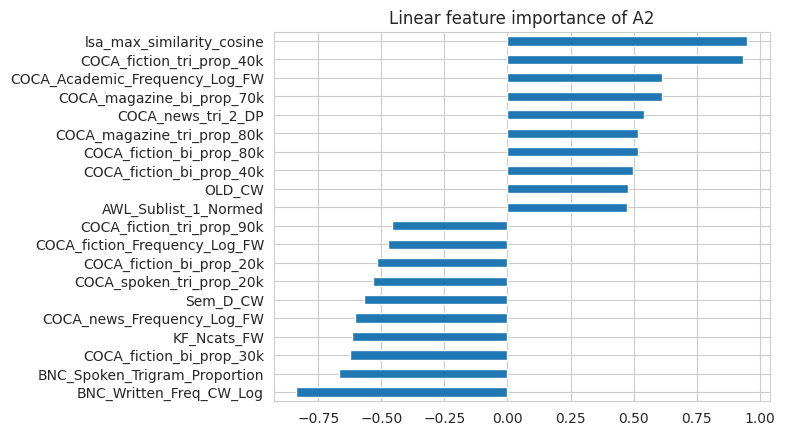

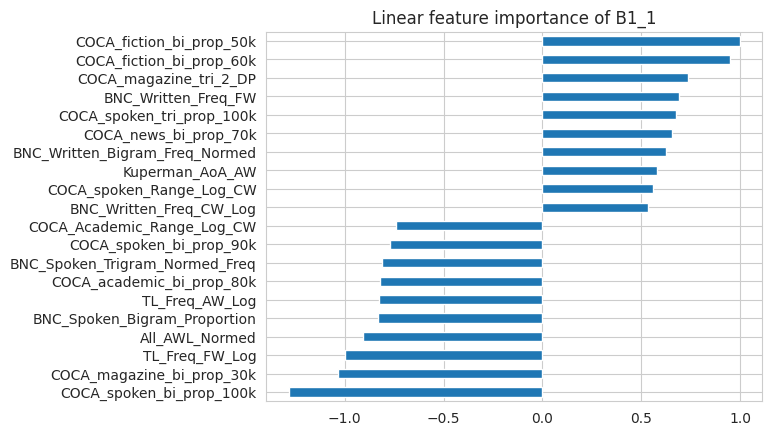

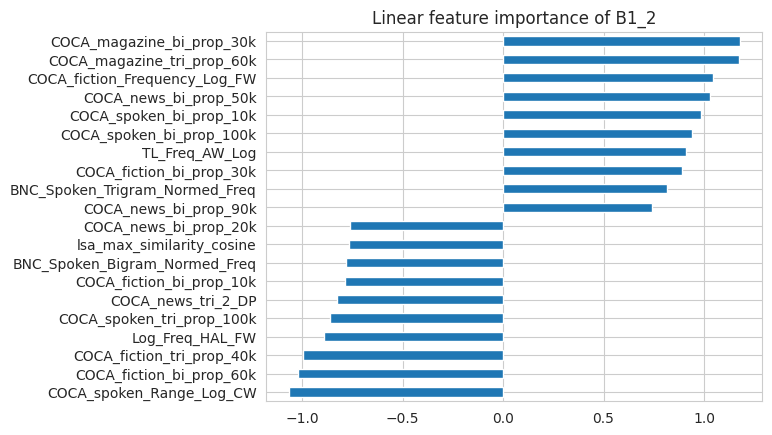

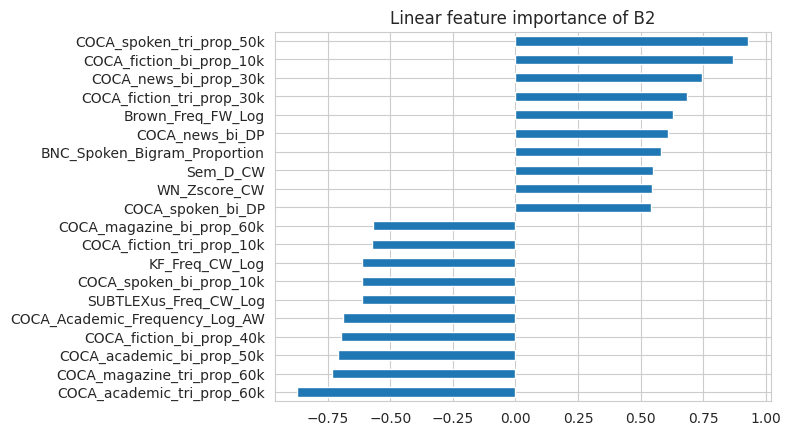

In [ ]:
for label in labels:
    linear_coefs_per_class(label, pos=10, neg=10)

In [ ]:
best_model = NuSVC(nu = 0.01)
best_model.fit(x_lex_simp_comp,y)

NuSVC(nu=0.01)

In [ ]:
# Compute Permutation Feature Importance
pfi = permutation_importance(best_model, x_lex_simp_comp, y, n_repeats=10, random_state=0, n_jobs=-1)

# Clean data
sorted_idx = pfi.importances_mean.argsort()[::-1]
pfi_df = pd.DataFrame(data=pfi.importances[sorted_idx].T, columns=x_lex_simp_comp.columns[sorted_idx])

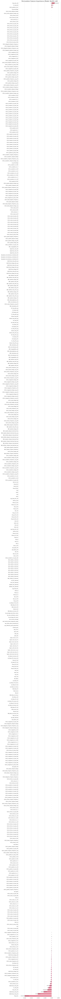

In [ ]:
plt.figure(figsize=(10, 160))
sb.barplot(data=pfi_df, orient="h").set_title("Permutation Feature Importance (Model: NuSVC_rbf)", fontsize=16);
plt.tight_layout()

In [ ]:
model = LGBMClassifier()
model.fit(x_lex_simp_comp,y)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.041316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 122489
[LightGBM] [Info] Number of data points in the train set: 3798, number of used features: 486
[LightGBM] [Info] Start training from score -2.250765
[LightGBM] [Info] Start training from score -1.458905
[LightGBM] [Info] Start training from score -0.705866
[LightGBM] [Info] Start training from score -1.780762


LGBMClassifier()

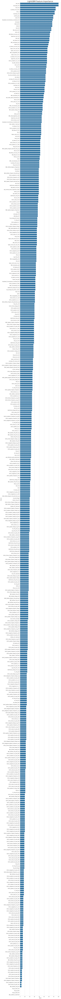

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model.feature_importances_,x_lex_simp_comp.columns)), columns=['Value','Feature'])
plt.figure(figsize=(10, 160))
sb.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Feature Importance', fontsize=20)
plt.tight_layout()
plt.show()

In [ ]:
# Compute Permutation Feature Importance
pfi = permutation_importance(model, x_lex_simp_comp, y, n_repeats=10, random_state=0, n_jobs=-1)

# Clean data
sorted_idx = pfi.importances_mean.argsort()[::-1]
pfi_df = pd.DataFrame(data=pfi.importances[sorted_idx].T, columns=x_lex_simp_comp.columns[sorted_idx])

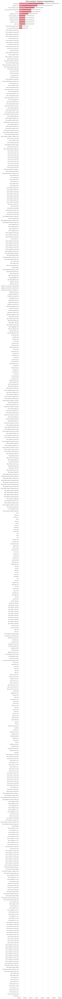

In [ ]:
plt.figure(figsize=(10, 160))
sb.barplot(data=pfi_df, orient="h").set_title("Permutation Feature Importance",  fontsize=20);
plt.tight_layout()

# <center> Experiment II Syntax Data

In [ ]:
x_syn_simp_comp.head()

,av_nominal_deps,av_nsubj_deps,av_nsubj_pass_deps,av_agents_deps,av_dobj_deps,av_pobj_deps,av_iobj_deps,av_ncomp_deps,av_nominal_deps_NN,av_nsubj_deps_NN,av_nsubj_pass_deps_NN,av_agents_deps_NN,av_dobj_deps_NN,av_pobj_deps_NN,av_iobj_deps_NN,av_ncomp_deps_NN,nominal_deps_stdev,nsubj_stdev,nsubj_pass_stdev,agents_stdev,dobj_stdev,pobj_stdev,iobj_stdev,ncomp_stdev,nominal_deps_NN_stdev,nsubj_NN_stdev,nsubj_pass_NN_stdev,agents_NN_stdev,dobj_NN_stdev,pobj_NN_stdev,iobj_NN_stdev,ncomp_NN_stdev,det_all_nominal_deps_struct,amod_all_nominal_deps_struct,prep_all_nominal_deps_struct,poss_all_nominal_deps_struct,vmod_all_nominal_deps_struct,nn_all_nominal_deps_struct,rcmod_all_nominal_deps_struct,advmod_all_nominal_deps_struct,conj_and_all_nominal_deps_struct,conj_or_all_nominal_deps_struct,det_all_nominal_deps_NN_struct,amod_all_nominal_deps_NN_struct,prep_all_nominal_deps_NN_struct,poss_all_nominal_deps_NN_struct,vmod_all_nominal_deps_NN_struct,nn_all_nominal_deps_NN_struct,rcmod_all_nominal_deps_NN_struct,advmod_all_nominal_deps_NN_struct,conj_and_all_nominal_deps_NN_struct,conj_or_all_nominal_deps_NN_struct,det_nsubj_deps_struct,amod_nsubj_deps_struct,prep_nsubj_deps_struct,poss_nsubj_deps_struct,vmod_nsubj_deps_struct,nn_nsubj_deps_struct,rcmod_nsubj_deps_struct,advmod_nsubj_deps_struct,conj_and_nsubj_deps_struct,conj_or_nsubj_deps_struct,det_nsubj_deps_NN_struct,amod_nsubj_deps_NN_struct,prep_nsubj_deps_NN_struct,poss_nsubj_deps_NN_struct,vmod_nsubj_deps_NN_struct,nn_nsubj_deps_NN_struct,rcmod_nsubj_deps_NN_struct,advmod_nsubj_deps_NN_struct,conj_and_nsubj_deps_NN_struct,conj_or_nsubj_deps_NN_struct,det_dobj_deps_struct,amod_dobj_deps_struct,prep_dobj_deps_struct,poss_dobj_deps_struct,vmod_dobj_deps_struct,nn_dobj_deps_struct,rcmod_dobj_deps_struct,advmod_dobj_deps_struct,conj_and_dobj_deps_struct,conj_or_dobj_deps_struct,det_dobj_deps_NN_struct,amod_dobj_deps_NN_struct,prep_dobj_deps_NN_struct,poss_dobj_deps_NN_struct,vmod_dobj_deps_NN_struct,nn_dobj_deps_NN_struct,rcmod_dobj_deps_NN_struct,advmod_dobj_deps_NN_struct,conj_and_dobj_deps_NN_struct,conj_or_dobj_deps_NN_struct,det_pobj_deps_struct,amod_pobj_deps_struct,prep_pobj_deps_struct,poss_pobj_deps_struct,vmod_pobj_deps_struct,nn_pobj_deps_struct,rcmod_pobj_deps_struct,advmod_pobj_deps_struct,conj_and_pobj_deps_struct,conj_or_pobj_deps_struct,det_pobj_deps_NN_struct,amod_pobj_deps_NN_struct,prep_pobj_deps_NN_struct,poss_pobj_deps_NN_struct,vmod_pobj_deps_NN_struct,nn_pobj_deps_NN_struct,rcmod_pobj_deps_NN_struct,advmod_pobj_deps_NN_struct,conj_and_pobj_deps_NN_struct,conj_or_pobj_deps_NN_struct,det_iobj_deps_struct,amod_iobj_deps_struct,prep_iobj_deps_struct,poss_iobj_deps_struct,vmod_iobj_deps_struct,nn_iobj_deps_struct,rcmod_iobj_deps_struct,advmod_iobj_deps_struct,conj_and_iobj_deps_struct,conj_or_iobj_deps_struct,det_iobj_deps_NN_struct,amod_iobj_deps_NN_struct,prep_iobj_deps_NN_struct,poss_iobj_deps_NN_struct,vmod_iobj_deps_NN_struct,nn_iobj_deps_NN_struct,rcmod_iobj_deps_NN_struct,advmod_iobj_deps_NN_struct,conj_and_iobj_deps_NN_struct,conj_or_iobj_deps_NN_struct,cl_av_deps,cl_ndeps_std_dev,acomp_per_cl,advcl_per_cl,agent_per_cl,cc_per_cl,ccomp_per_cl,conj_per_cl,csubj_per_cl,csubjpass_per_cl,dep_per_cl,discourse_per_cl,dobj_per_cl,expl_per_cl,iobj_per_cl,mark_per_cl,ncomp_per_cl,neg_per_cl,nsubj_per_cl,nsubjpass_per_cl,parataxis_per_cl,pcomp_per_cl,prep_per_cl,prepc_per_cl,prt_per_cl,tmod_per_cl,xcomp_per_cl,xsubj_per_cl,advmod_per_cl,aux_per_cl,auxpass_per_cl,modal_per_cl,acad_av_lemma_freq,acad_av_construction_freq,acad_av_lemma_construction_freq,acad_av_approx_collexeme,acad_av_faith_verb_cue,acad_av_faith_const_cue,acad_av_delta_p_verb_cue,acad_av_delta_p_const_cue,acad_av_lemma_freq_log,acad_av_construction_freq_log,acad_av_lemma_construction_freq_log,acad_av_lemma_freq_type,acad_av_construction_freq_type,acad_av_lemma_construction_freq_type,acad_av_approx_collexeme_type,acad_av_faith_verb_cue_type,acad_av_faith_const_cue_type,acad_av_delta_p_verb_cue_type,acad_av_

In [ ]:
duplicate_columns = x_syn_simp_comp.columns[x_syn_simp_comp.columns.duplicated()]
duplicate_columns

Index([], dtype='object')

In [ ]:
x_syn_simp_comp = x_syn_simp_comp.loc[:,~x_syn_simp_comp.columns.duplicated()].copy()

In [ ]:
preds = {}
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
results = pd.DataFrame({'Model': [], 'Accuracy': [], 'Bal Acc.': [], 'Time': []})

for name, model in models.items():
    #cv_r = cross_val_score(model, x, y, cv=skf, scoring='accuracy')

    start_time = time.time()
    pred = cross_val_predict(model, x_syn_simp_comp, y, cv=skf)
    total_time = time.time() - start_time

    preds[name] = pred
    results = pd.concat([results, pd.DataFrame({"Model": [name],
                                                "Accuracy": [accuracy_score(y, pred)*100],
                                                "Bal Acc.": [balanced_accuracy_score(y, pred)*100],
                                                "Time": [total_time]})], ignore_index=True)

    results_ord = results.sort_values(by=['Bal Acc.'], ascending=False, ignore_index=True)
    results_ord.index += 1

    clear_output(wait=True)
    #display(results_ord.style.background_gradient(subset=['Accuracy', "Bal Acc.", 'Time'], cmap='Greens'))
    display(results_ord.style.bar(subset=['Accuracy', 'Bal Acc.'], vmin=0, vmax=100, color='#5fba7d'))

,Model,Accuracy,Bal Acc.,Time
1,GaussianNB,17.272249,30.229836,0.251698
2,Ridge .00001,47.867299,29.157055,0.555124
3,LinearSVC,46.919431,29.137534,72.541017
4,Ridge .0001,47.867299,29.127097,0.756265
5,Ridge .1,47.893628,29.121222,0.604215
6,LightGBM,46.577146,29.070827,70.255620
7,Ridge .01,47.709321,28.933785,0.690392
8,Ridge .001,47.735650,28.932139,0.736821
9,Ridge 1.,48.077936,28.870388,0.603270
10,Ridge .5,48.051606,28.825159,0.670738


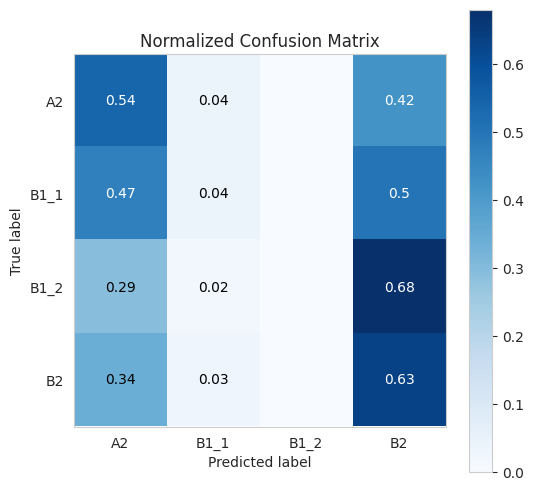

In [ ]:
y_pred = le.inverse_transform(y)
skplt.metrics.plot_confusion_matrix(y_pred, le.inverse_transform(preds["GaussianNB"]), normalize=True, hide_zeros=True, figsize=(6, 6));

In [ ]:
preds_str = {model:le.inverse_transform(pred) for model, pred in preds.items()}
preds_df = pd.DataFrame(preds_str)
preds_df["Target"] = y_pred
preds_df.head()

,LogRegr l1 liblin,LogRegr l2 lbfgs,LogRegr l1 saga,LogRegr l2 saga,LogRegr elasticnet,Ridge 1.,Ridge .5,Ridge .1,Ridge .01,Ridge .001,Ridge .0001,Ridge .00001,SVM_lin,SVM_rbf,NuSVC_rbf,NuSVC_lin,LinearSVC,KNN3,KNN5,GaussianNB,Decision Tree,Extra Trees,Random Forest,XGBoost,LightGBM,Dummy_classifier,Target
0,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,A2,A2,B1_2,B1_2,B1_2,B2,B1_2,B1_1,B1_2,B1_2,B1_2,B1_2,B1_2
1,B2,B2,B2,B2,B2,B2,B2,B2,B2,B2,B2,B2,B1_2,B1_2,A2,B2,B2,B2,B1_1,A2,B1_1,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2
2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,A2,B1_2,A2,B1_2,B2,B1_1,A2,A2,B2,B1_1,B1_2,B1_1
3,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,A2,B1_2,A2,B1_2,A2,B1_1,B1_2,B1_2,B1_2,B2,B1_2,B1_2
4,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2,B2,A2,B1_2,B1_2,B1_2,B2,B1_1,B1_2,B1_2,B1_2,B1_2,B1_2,B1_1


In [ ]:
def categ_corr(df):
    corr = pd.DataFrame()
    for a in list(df.columns.values):
        for b in list(df.columns.values):
            corr.loc[a, b] = (df[a]==df[b]).sum()/len(df)
    return corr

ccorr = categ_corr(preds_df)

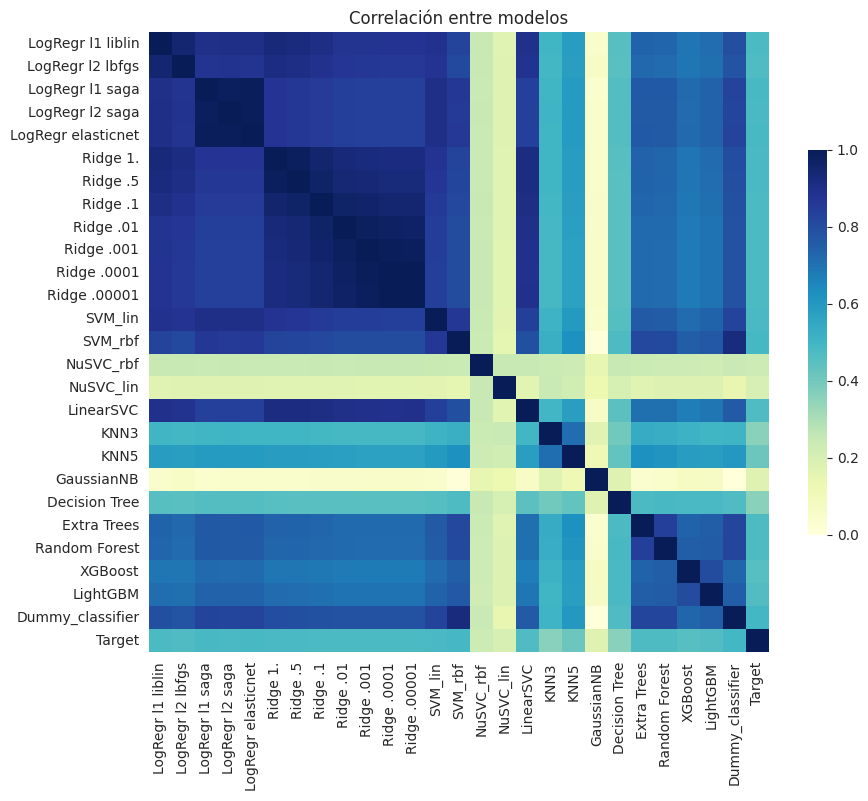

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
sb.heatmap(
    ccorr,
    #mask=np.triu(np.ones_like(ccorr, dtype=np.bool)),
    vmin=0, vmax=1,
    cmap="YlGnBu",#sb.diverging_palette(20, 220, n=200),
    square=True,
    #linewidths=.4,
    cbar_kws={"shrink": .5},
    #annot=True, fmt=".0%"
).set_title("Correlación entre modelos");

# Interpretability

In [ ]:
best_model = RidgeClassifier(alpha=1.)
best_model.fit(x_syn_simp_comp,y)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=6.69405e-18): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


RidgeClassifier()

In [ ]:
coef_df = pd.DataFrame(np.transpose(best_model.coef_), index=x_syn_simp_comp.columns, columns=labels)
coef_df["General"] = coef_df.abs().sum(axis=1)
coef_df

,A2,B1_1,B1_2,B2,General
av_nominal_deps,1.013133e-01,3.577619e-02,-2.126191e-01,7.552954e-02,0.425238
av_nsubj_deps,-2.451983e-01,2.861567e-01,-6.085892e-02,1.990053e-02,0.612114
av_nsubj_pass_deps,-3.079031e-02,-1.470346e-01,6.846069e-02,1.093642e-01,0.355650
av_agents_deps,6.515930e-02,-3.193593e-01,3.901856e-01,-1.359856e-01,0.910690
av_dobj_deps,1.243344e-02,9.735819e-02,-1.136032e-01,3.811545e-03,0.227206
av_pobj_deps,4.819497e-03,-2.192804e-02,3.190036e-02,-1.479182e-02,0.073440
av_iobj_deps,-7.224697e-02,2.957448e-02,8.833295e-02,-4.566045e-02,0.235815
av_ncomp_deps,-8.626768e-02,1.137943e-01,4.760395e-02,-7.513054e-02,0.322796
av_nominal_deps_NN,2.205644e-01,-1.993021e-02,-1.239451e-02,-1.882397e-01,0.441129
av_nsubj_deps_NN,-2.184444e-03,-7.387558e-02,-5.431400e-02,1.303740e-01,0.260748


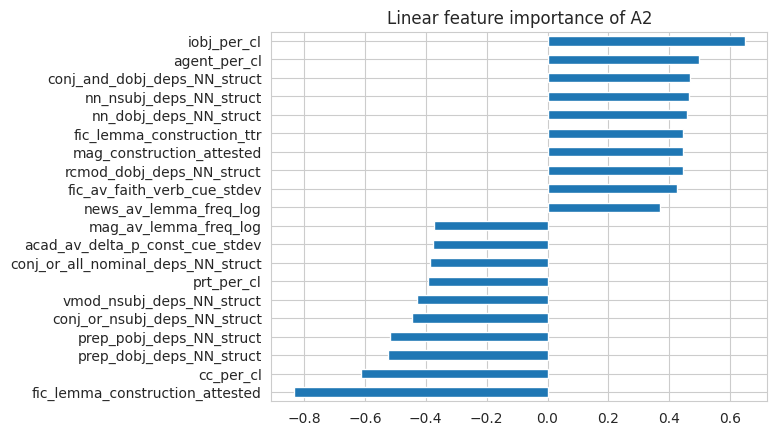

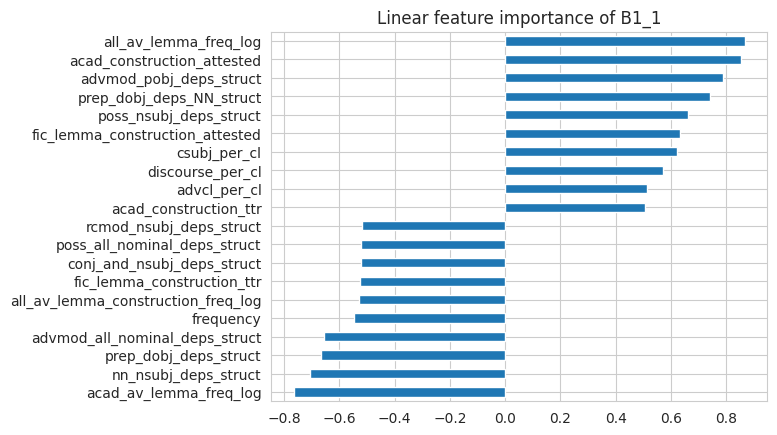

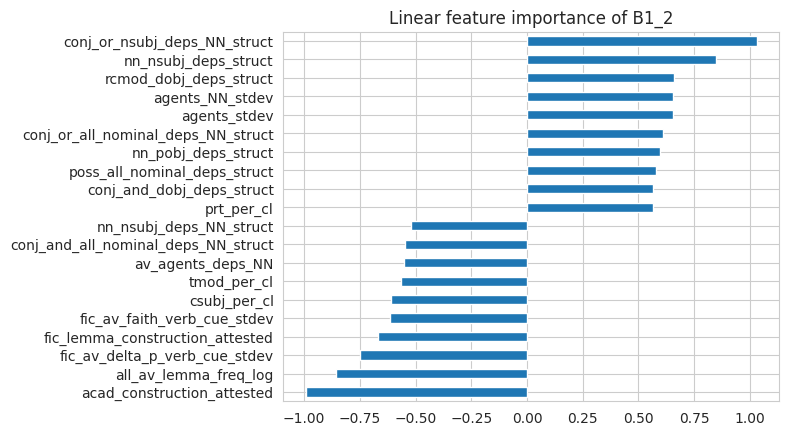

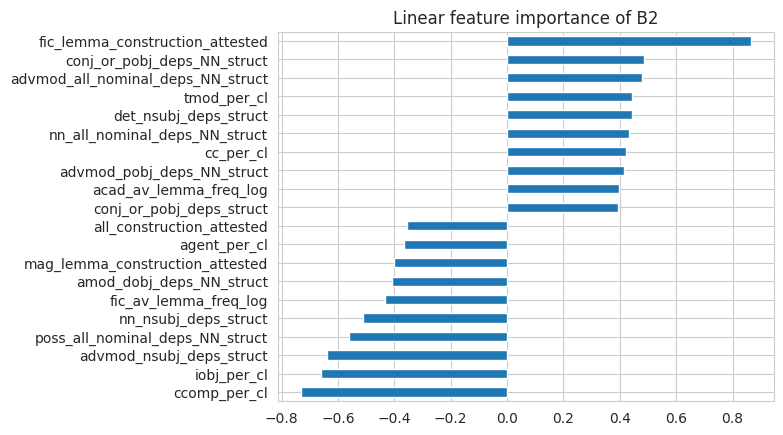

In [ ]:
def linear_coefs_per_class(CEFR, pos=10, neg=10):
    coef_CEFR = coef_df[CEFR].sort_values()
    # Use concat instead of append
    coef_CEFR = pd.concat([coef_CEFR.head(neg), coef_CEFR.tail(pos)])

    coef_CEFR.plot(kind="barh")
    plt.title("Linear feature importance of " + CEFR)
    plt.show()

# Assuming 'labels' is a list of labels you want to plot
for label in labels:
    linear_coefs_per_class(label, pos=10, neg=10)


In [ ]:
# Compute Permutation Feature Importance
pfi = permutation_importance(best_model, x_syn_simp_comp, y, n_repeats=10, random_state=0, n_jobs=-1)

# Clean data
sorted_idx = pfi.importances_mean.argsort()[::-1]
pfi_df = pd.DataFrame(data=pfi.importances[sorted_idx].T, columns=x_syn_simp_comp.columns[sorted_idx])

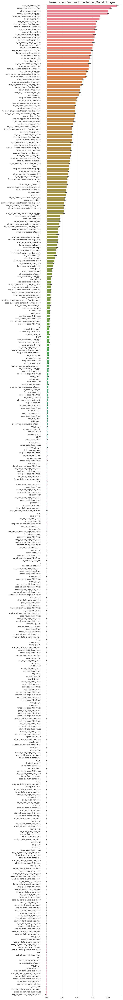

In [ ]:
plt.figure(figsize=(10, 80))
sb.barplot(data=pfi_df, orient="h").set_title("Permutation Feature Importance (Model: Ridge)", fontsize=16);
plt.tight_layout()

In [ ]:
model = LGBMClassifier()
model.fit(x_syn_simp_comp,y)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.017272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 50814
[LightGBM] [Info] Number of data points in the train set: 3798, number of used features: 348
[LightGBM] [Info] Start training from score -2.250765
[LightGBM] [Info] Start training from score -1.458905
[LightGBM] [Info] Start training from score -0.705866
[LightGBM] [Info] Start training from score -1.780762


LGBMClassifier()

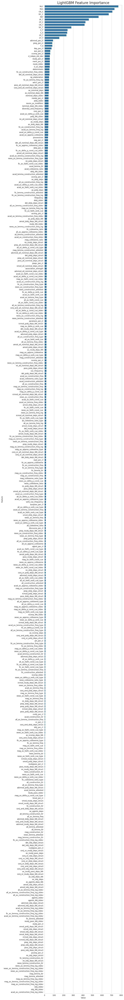

In [ ]:
feature_imp = pd.DataFrame(sorted(zip(model.feature_importances_,x_syn_simp_comp.columns)), columns=['Value','Feature'])
plt.figure(figsize=(10, 80))
sb.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Feature Importance', fontsize=20)
plt.tight_layout()
plt.show()

In [ ]:
# Compute Permutation Feature Importance
pfi = permutation_importance(model, x_syn_simp_comp, y, n_repeats=10, random_state=0, n_jobs=-1)

# Clean data
sorted_idx = pfi.importances_mean.argsort()[::-1]
pfi_df = pd.DataFrame(data=pfi.importances[sorted_idx].T, columns=x_syn_simp_comp.columns[sorted_idx])

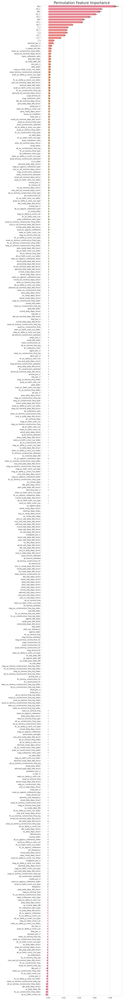

In [ ]:
plt.figure(figsize=(10, 80))
sb.barplot(data=pfi_df, orient="h").set_title("Permutation Feature Importance",  fontsize=20);
plt.tight_layout()

# Experiment III Mix of Lexis and Syntax features

In [ ]:
x_lex_syn_simp_comp = pd.concat([x_lex_simp_comp, x_syn_simp_comp],axis=1)

In [ ]:
x_lex_syn_simp_comp.head()

,KF_Freq_AW,KF_Freq_AW_Log,KF_Ncats_AW,KF_Nsamp_AW,TL_Freq_AW,TL_Freq_AW_Log,Brown_Freq_AW,Brown_Freq_AW_Log,KF_Freq_CW,KF_Freq_CW_Log,KF_Ncats_CW,KF_Nsamp_CW,TL_Freq_CW,TL_Freq_CW_Log,Brown_Freq_CW,Brown_Freq_CW_Log,KF_Freq_FW,KF_Freq_FW_Log,KF_Ncats_FW,KF_Nsamp_FW,TL_Freq_FW,TL_Freq_FW_Log,Brown_Freq_FW,Brown_Freq_FW_Log,MRC_Familiarity_AW,MRC_Concreteness_AW,MRC_Imageability_AW,MRC_Meaningfulness_AW,MRC_Familiarity_CW,MRC_Concreteness_CW,MRC_Imageability_CW,MRC_Familiarity_FW,MRC_Concreteness_FW,MRC_Imageability_FW,MRC_Meaningfulness_FW,Kuperman_AoA_AW,Kuperman_AoA_CW,Kuperman_AoA_FW,Brysbaert_Concreteness_Combined_AW,Brysbaert_Concreteness_Combined_CW,Brysbaert_Concreteness_Combined_FW,SUBTLEXus_Freq_AW,SUBTLEXus_Range_AW,SUBTLEXus_Freq_AW_Log,SUBTLEXus_Range_AW_Log,SUBTLEXus_Freq_CW,SUBTLEXus_Range_CW,SUBTLEXus_Freq_CW_Log,SUBTLEXus_Range_CW_Log,SUBTLEXus_Freq_FW,SUBTLEXus_Range_FW,SUBTLEXus_Freq_FW_Log,SUBTLEXus_Range_FW_Log,BNC_Written_Freq_AW,BNC_Written_Freq_AW_Log,BNC_Written_Range_AW,BNC_Spoken_Freq_AW,BNC_Spoken_Freq_AW_Log,BNC_Spoken_Range_AW,BNC_Written_Freq_CW,BNC_Written_Freq_CW_Log,BNC_Written_Range_CW,BNC_Spoken_Freq_CW,BNC_Spoken_Freq_CW_Log,BNC_Spoken_Range_CW,BNC_Written_Freq_FW,BNC_Written_Freq_FW_Log,BNC_Written_Range_FW,BNC_Spoken_Freq_FW,BNC_Spoken_Freq_FW_Log,BNC_Spoken_Range_FW,BNC_Spoken_Bigram_Normed_Freq,BNC_Spoken_Bigram_Normed_Freq_Log,BNC_Written_Bigram_Freq_Normed,BNC_Written_Bigram_Freq_Normed_Log,BNC_Spoken_Trigram_Normed_Freq,BNC_Spoken_Trigram_Normed_Freq_Log,BNC_Written_Trigram_Freq_Normed,BNC_Written_Trigram_Freq_Normed_Log,BNC_Spoken_Bigram_Proportion,BNC_Written_Bigram_Proportion,BNC_Spoken_Trigram_Proportion,BNC_Written_Trigram_Proportion,COCA_Academic_Range_AW,COCA_Academic_Frequency_AW,COCA_Academic_Range_Log_AW,COCA_Academic_Frequency_Log_AW,COCA_Academic_Range_CW,COCA_Academic_Frequency_CW,COCA_Academic_Range_Log_CW,COCA_Academic_Frequency_Log_CW,COCA_Academic_Range_FW,COCA_Academic_Frequency_FW,COCA_Academic_Range_Log_FW,COCA_Academic_Frequency_Log_FW,COCA_fiction_Range_AW,COCA_fiction_Frequency_AW,COCA_fiction_Range_Log_AW,COCA_fiction_Frequency_Log_AW,COCA_fiction_Range_CW,COCA_fiction_Frequency_CW,COCA_fiction_Range_Log_CW,COCA_fiction_Frequency_Log_CW,COCA_fiction_Range_FW,COCA_fiction_Frequency_FW,COCA_fiction_Range_Log_FW,COCA_fiction_Frequency_Log_FW,COCA_magazine_Range_AW,COCA_magazine_Frequency_AW,COCA_magazine_Range_Log_AW,COCA_magazine_Frequency_Log_AW,COCA_magazine_Range_CW,COCA_magazine_Frequency_CW,COCA_magazine_Range_Log_CW,COCA_magazine_Frequency_Log_CW,COCA_magazine_Range_FW,COCA_magazine_Frequency_FW,COCA_magazine_Range_Log_FW,COCA_magazine_Frequency_Log_FW,COCA_news_Range_AW,COCA_news_Frequency_AW,COCA_news_Range_Log_AW,COCA_news_Frequency_Log_AW,COCA_news_Range_CW,COCA_news_Frequency_CW,COCA_news_Range_Log_CW,COCA_news_Frequency_Log_CW,COCA_news_Range_FW,COCA_news_Frequency_FW,COCA_news_Range_Log_FW,COCA_news_Frequency_Log_FW,COCA_spoken_Range_AW,COCA_spoken_Frequency_AW,COCA_spoken_Range_Log_AW,COCA_spoken_Frequency_Log_AW,COCA_spoken_Range_CW,COCA_spoken_Frequency_CW,COCA_spoken_Range_Log_CW,COCA_spoken_Frequency_Log_CW,COCA_spoken_Range_FW,COCA_spoken_Frequency_FW,COCA_spoken_Range_Log_FW,COCA_spoken_Frequency_Log_FW,COCA_Academic_Bigram_Frequency,COCA_Academic_Bigram_Range,COCA_Academic_Bigram_Frequency_Log,COCA_Academic_Bigram_Range_Log,COCA_academic_bi_MI,COCA_academic_bi_MI2,COCA_academic_bi_T,COCA_academic_bi_DP,COCA_academic_bi_AC,COCA_academic_bi_prop_10k,COCA_academic_bi_prop_20k,COCA_academic_bi_prop_30k,COCA_academic_bi_prop_40k,COCA_academic_bi_prop_50k,COCA_academic_bi_prop_60k,COCA_academic_bi_prop_70k,COCA_academic_bi_prop_80k,COCA_academic_bi_prop_90k,COCA_academic_bi_prop_100k,COCA_Fiction_Bigram_Frequency,COCA_Fiction_Bigram_Range,COCA_Fiction_Bigram_Frequency_Log,COCA_Fiction_Bigram_Range_Log,COCA_fiction_bi_MI,COCA_fiction_bi_MI2,COCA_fiction_bi_T,COCA_fiction_bi_DP,COCA_fiction_bi_AC,COCA_fiction_bi_prop_10k,COCA_fiction_bi_prop_20k,COCA

In [ ]:
from IPython.display import clear_output

preds = {}
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
results = pd.DataFrame({'Model': [], 'Accuracy': [], 'Bal Acc.': [], 'Time': []})

for name, model in models.items():
    #cv_r = cross_val_score(model, x, y, cv=skf, scoring='accuracy')

    start_time = time.time()
    pred = cross_val_predict(model, x_lex_syn_simp_comp, y, cv=skf)
    total_time = time.time() - start_time

    preds[name] = pred
    results = pd.concat([results, pd.DataFrame({"Model": [name],
                                                "Accuracy": [accuracy_score(y, pred)*100],
                                                "Bal Acc.": [balanced_accuracy_score(y, pred)*100],
                                                "Time": [total_time]})], ignore_index=True)

    results_ord = results.sort_values(by=['Bal Acc.'], ascending=False, ignore_index=True)
    results_ord.index += 1

    clear_output(wait=True)
    #display(results_ord.style.background_gradient(subset=['Accuracy', "Bal Acc.", 'Time'], cmap='Greens'))
    display(results_ord.style.bar(subset=['Accuracy', 'Bal Acc.'], vmin=0, vmax=100, color='#5fba7d'))

,Model,Accuracy,Bal Acc.,Time
1,NuSVC_rbf,51.158504,40.707713,43.160750
2,XGBoost,52.080042,35.381480,387.064159
3,LogRegr l2 lbfgs,46.893102,35.331062,12.959790
4,KNN3,43.338599,35.152664,1.326634
5,NuSVC_lin,39.125856,35.041357,374.523489
6,Ridge .1,48.209584,34.839230,1.607661
7,LogRegr l1 liblin,48.130595,34.741416,652.889613
8,Ridge .5,48.604529,34.717085,1.580847
9,Ridge 1.,48.736177,34.569460,1.556924
10,Ridge .01,47.551343,34.431001,1.559395


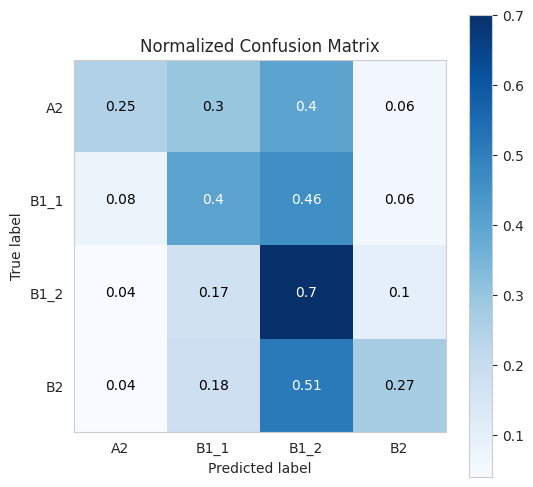

In [ ]:
y_pred = le.inverse_transform(y)
skplt.metrics.plot_confusion_matrix(y_pred, le.inverse_transform(preds["NuSVC_rbf"]), normalize=True, hide_zeros=True, figsize=(6, 6));

In [ ]:
preds_str = {model:le.inverse_transform(pred) for model, pred in preds.items()}

In [ ]:
preds_df = pd.DataFrame(preds_str)
preds_df["Target"] = y_pred
preds_df.head()

,LogRegr l1 liblin,LogRegr l2 lbfgs,LogRegr l1 saga,LogRegr l2 saga,LogRegr elasticnet,Ridge 1.,Ridge .5,Ridge .1,Ridge .01,Ridge .001,Ridge .0001,Ridge .00001,SVM_lin,SVM_rbf,NuSVC_rbf,NuSVC_lin,LinearSVC,KNN3,KNN5,GaussianNB,Decision Tree,Extra Trees,Random Forest,XGBoost,LightGBM,Dummy_classifier,Target
0,B1_1,B1_1,B1_2,B1_2,B1_2,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_2,B1_2,B1_1,B1_1,B2,B1_2,B1_2,B2,B2,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2
1,B1_1,B2,B2,B2,B2,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B2,B1_2,B1_1,B2,B1_1,A2,B1_1,A2,B1_1,B1_2,B1_2,B1_2,B1_2,B1_2,B1_2
2,B1_1,A2,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_2,B1_2,B1_1,B1_1,B1_1,B1_2,B1_2,B2,A2,B1_2,B1_2,B1_2,B1_1,B1_2,B1_1
3,B1_2,B2,B1_2,B1_2,B1_2,B1_2,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_1,B1_2,B1_1,A2,B2,B1_2,B1_2,A2,B1_2,B1_2,B1_2,B1_1,B1_1,B1_2,B1_2
4,B1_1,B1_1,B1_2,B1_2,B1_2,A2,A2,A2,A2,A2,A2,A2,B1_2,B1_2,B1_2,A2,A2,B1_2,B1_2,B2,B1_1,B1_2,B1_2,B1_1,B1_2,B1_2,B1_1


In [ ]:
def categ_corr(df):
    corr = pd.DataFrame()
    for a in list(df.columns.values):
        for b in list(df.columns.values):
            corr.loc[a, b] = (df[a]==df[b]).sum()/len(df)
    return corr

ccorr = categ_corr(preds_df)

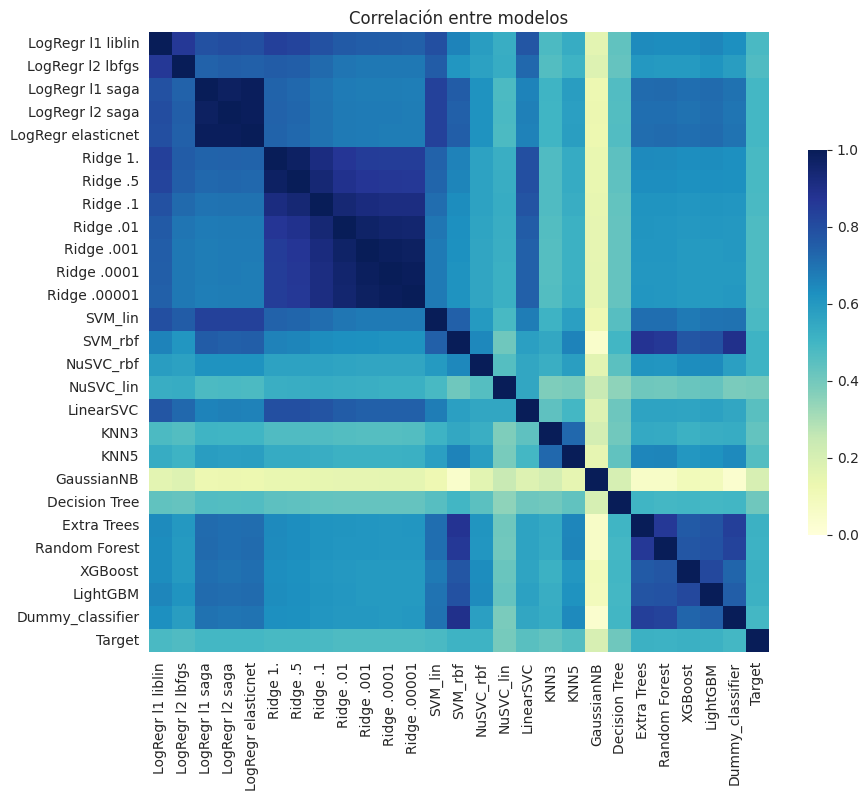

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
sb.heatmap(
    ccorr,
    #mask=np.triu(np.ones_like(ccorr, dtype=np.bool)),
    vmin=0, vmax=1,
    cmap="YlGnBu",#sb.diverging_palette(20, 220, n=200),
    square=True,
    #linewidths=.4,
    cbar_kws={"shrink": .5},
    #annot=True, fmt=".0%"
).set_title("Correlación entre modelos");

In [ ]:
best_model = NuSVC(nu = 0.01)
best_model.fit(x_lex_simp_comp,y)

NuSVC(nu=0.01)

In [ ]:
# Compute Permutation Feature Importance
pfi = permutation_importance(best_model, x_lex_simp_comp, y, n_repeats=10, random_state=0, n_jobs=-1) # Use the same data the model was trained on.

# Clean data
sorted_idx = pfi.importances_mean.argsort()[::-1]
pfi_df = pd.DataFrame(data=pfi.importances[sorted_idx].T, columns=x_lex_simp_comp.columns[sorted_idx]) # Use the same data the model was trained on.

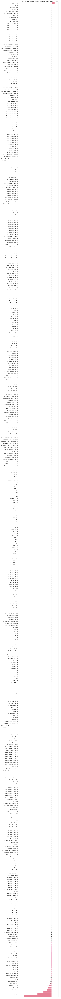

In [ ]:
plt.figure(figsize=(10, 160))
sb.barplot(data=pfi_df, orient="h").set_title("Permutation Feature Importance (Model: NuSVC_rbf)", fontsize=16);
plt.tight_layout()

# Experiment IV Machine Learning using Count Vectorizer

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import glob
import os
import re
from sklearn.feature_extraction.text import CountVectorizer

# Step 1: Load the Data
file_list = glob.glob('/content/drive/MyDrive/processed data ICNALE/*.txt')
data_list = []

# Define a regular expression pattern to match CEFR labels
cefr_pattern = re.compile(r'(A2|B1_1|B1_2|B2)')

for file in file_list:
    with open(file, 'r', encoding='utf-8') as f:
        text = f.read()
        # Extract the CEFR label from the filename using the regex pattern
        cefr_label_match = cefr_pattern.search(os.path.basename(file))
        if cefr_label_match:
            cefr_label = cefr_label_match.group()
        else:
            cefr_label = 'Unknown'  # Default label if no match is found
        # Extract the filename without the extension
        filename = os.path.basename(file).split('.')[0]
        data_list.append({'filename': filename, 'text': text, 'CEFR': cefr_label})

df = pd.DataFrame(data_list)

# Step 2: Initialize the CountVectorizer
vectorizer = CountVectorizer()

# Step 3: Fit the vectorizer on the 'text' column and transform the data
df_counts = vectorizer.fit_transform(df['text'])

# Step 4: Convert the matrix to a DataFrame
df_counts = pd.DataFrame(df_counts.toarray(), columns=vectorizer.get_feature_names_out())

# Step 5: Concatenate the original DataFrame with the new CountVectorizer DataFrame
df = pd.concat([df.reset_index(drop=True), df_counts], axis=1)

In [ ]:
df.head()

,filename,text,CEFR,000,01,10,100,1000,11,12,...,your,yoursel,yourself,youth,yuan,yuck,zero,zon,zone,zones
0,SM_PHL_PTJ1_066_B1_2,I believe that part-time job for college stude...,B1_2,0,0,0,0,0,0,0,...,3,0,0,0,0,0,0,0,0,0
1,SM_PHL_PTJ1_019_B1_1,"For every student in my generation, I think mo...",B1_1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,SM_PHL_PTJ2_021_B1_2,Having a part-time job as a college student is...,B1_2,0,0,0,0,0,0,0,...,6,0,0,0,0,0,0,0,0,0
3,SM_PHL_PTJ1_026_B1_2,I don't think it's important to get a part-tim...,B1_2,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,SM_PHL_PTJ1_054_B1_2,I would have to disagree with the part-time jo...,B1_2,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0


In [ ]:
y = df["CEFR"]

# Drop the unnecessary columns
x_df = df.drop(columns=["filename", "text", "CEFR"])


In [ ]:
from IPython.display import clear_output

preds = {}
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
results = pd.DataFrame({'Model': [], 'Accuracy': [], 'Bal Acc.': [], 'Time': []})

for name, model in models.items():
    #cv_r = cross_val_score(model, x, y, cv=skf, scoring='accuracy')

    start_time = time.time()
    pred = cross_val_predict(model, x_df, y, cv=skf)
    total_time = time.time() - start_time

    preds[name] = pred
    results = pd.concat([results, pd.DataFrame({"Model": [name],
                                                "Accuracy": [accuracy_score(y, pred)*100],
                                                "Bal Acc.": [balanced_accuracy_score(y, pred)*100],
                                                "Time": [total_time]})], ignore_index=True)

    results_ord = results.sort_values(by=['Bal Acc.'], ascending=False, ignore_index=True)
    results_ord.index += 1

    clear_output(wait=True)
    #display(results_ord.style.background_gradient(subset=['Accuracy', "Bal Acc.", 'Time'], cmap='Greens'))
    display(results_ord.style.bar(subset=['Accuracy', 'Bal Acc.'], vmin=0, vmax=100, color='#5fba7d'))

,Model,Accuracy,Bal Acc.,Time
1,LogRegr elasticnet,55.371248,48.443284,419.642327
2,LogRegr l1 saga,55.344918,48.158388,440.157952
3,LogRegr l2 saga,54.844655,48.127450,163.609422
4,LightGBM,58.846761,44.680174,12.440571
5,LogRegr l2 lbfgs,52.238020,43.788861,57.591764
6,LogRegr l1 liblin,52.606635,43.346757,224.007233
7,SVM_lin,49.025803,43.042964,401.845551
8,GaussianNB,49.157451,43.003546,6.675952
9,NuSVC_lin,48.578199,42.895422,416.055100
10,XGBoost,56.951027,41.674546,121.998430


In [ ]:
y_pred = le.inverse_transform(y)

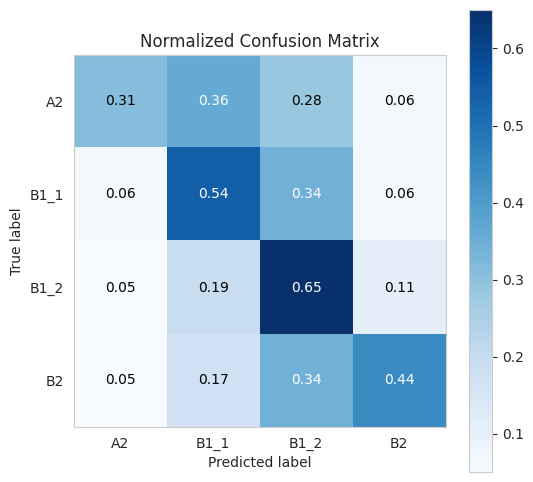

In [ ]:
skplt.metrics.plot_confusion_matrix(y_pred, le.inverse_transform(preds["LogRegr elasticnet"]), normalize=True, hide_zeros=True, figsize=(6, 6));

# Experiment V Machine Learning using TF-IDF

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [7]:
import pandas as pd
import glob
import os
import re
from sklearn.feature_extraction.text import TfidfVectorizer

# Step 1: Load the Data
file_list = glob.glob('/content/drive/MyDrive/processed data ICNALE/*.txt')
data_list = []

# Define a regular expression pattern to match CEFR labels
cefr_pattern = re.compile(r'(A2|B1_1|B1_2|B2)')

for file in file_list:
    with open(file, 'r', encoding='utf-8') as f:
        text = f.read()
        # Extract the CEFR label from the filename using the regex pattern
        cefr_label_match = cefr_pattern.search(os.path.basename(file))
        if cefr_label_match:
            cefr_label = cefr_label_match.group()
        else:
            cefr_label = 'Unknown'  # Default label if no match is found
        # Extract the filename without the extension
        filename = os.path.basename(file).split('.')[0]
        data_list.append({'filename': filename, 'text': text, 'CEFR': cefr_label})

df = pd.DataFrame(data_list)

# Step 2: Initialize the TfidfVectorizer
vectorizer = TfidfVectorizer()

# Step 3: Fit the vectorizer on the 'text' column and transform the data
df_tfidf = vectorizer.fit_transform(df['text'])

# Step 4: Convert the matrix to a DataFrame
df_tfidf = pd.DataFrame(df_tfidf.toarray(), columns=vectorizer.get_feature_names_out())

# Step 5: Concatenate the original DataFrame with the new TfidfVectorizer DataFrame
df = pd.concat([df.reset_index(drop=True), df_tfidf], axis=1)


In [8]:
df.head()

filename                                               text  \
0  SM_PHL_PTJ1_066_B1_2  I believe that part-time job for college stude...   
1  SM_PHL_PTJ1_019_B1_1  For every student in my generation, I think mo...   
2  SM_PHL_PTJ2_021_B1_2  Having a part-time job as a college student is...   
3  SM_PHL_PTJ1_026_B1_2  I don't think it's important to get a part-tim...   
4  SM_PHL_PTJ1_054_B1_2  I would have to disagree with the part-time jo...   

   CEFR  000   01   10  100  1000   11   12  120   13   14   15  150   16  \
0  B1_2  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
1  B1_1  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
2  B1_2  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
3  B1_2  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   
4  B1_2  0.0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0  0.0   

    17   18   19  1990   20  200  2000  2008  20k  20s   21  21st   23   24  \
0  0.0  0.0  0.0   0.0  0.0  0.0   0.0   0.0  0.0  0.0  0.0   0.0  0.0  0.0   
1  0.0  0.0  0.0   0.0  0.0  0.0   0.0   0.0  0.0  0.0  0.0   0.0  0.0  0.0   
2  0.0  0.0  0.0   0.0  0.0  0.0   0.0   0.0  0.0  0.0  0.0   0.0  0.0  0.0   
3  0.0  0.0  0.0   0.0  0.0  0.0   0.0   0.0  0.0  0.0  0.0   0.0  0.0  0.0   
4  0.0  0.0  0.0   0.0  0.0  0.0   0.0   0.0  0.0  0.0  0.0   0.0  0.0  0.0   

    25   30  300  3000   35   37  383   40  400  4000   50  500  5000   54  \
0  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0   0.0  0.0   
1  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0   0.0  0.0   
2  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0   0.0  0.0   
3  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0   0.0  0.0   
4  0.0  0.0  0.0   0.0  0.0  0.0  0.0  0.0  0.0   0.0  0.0  0.0   0.0  0.0   

         60   65   70  700  7000   87   90  _smoking   aa  aah   ab  aban  \
0  0.000000  0.0  0.0  0.0   0.0  0.0  0.0       0.0  0.0  0.0  0.0   0.0   
1  0.000000  0.0  0.0  0.0   0.0  0.0  0.0       0.0  0.0  0.0  0.0   0.0   
2  0.147338  0.0  0.0  0.0   0.0  0.0  0.0       0.0  0.0  0.0  0.0   0.0   
3  0.000000  0.0  0.0  0.0   0.0  0.0  0.0       0.0  0.0  0.0  0.0   0.0   
4  0.000000  0.0  0.0  0.0   0.0  0.0  0.0       0.0  0.0  0.0  0.0   0.0   

   abanded  abandon  abandoned  abandoning  abandons  abilit  abilitie  \
0      0.0      0.0        0.0         0.0       0.0     0.0       0.0   
1      0.0      0.0        0.0         0.0       0.0     0.0       0.0   
2      0.0      0.0        0.0         0.0       0.0     0.0       0.0   
3      0.0      0.0        0.0         0.0       0.0     0.0       0.0   
4      0.0      0.0        0.0         0.0       0.0     0.0       0.0   

   abilities  ability  abl      able  abnormal  abnormally  abou    about  \
0        0.0      0.0  0.0  0.315596       0.0         0.0   0.0  0.00000   
1        0.0      0.0  0.0  0.000000       0.0         0.0   0.0  0.00000   
2        0.0      0.0  0.0  0.000000       0.0         0.0   0.0  0.05423   
3        0.0      0.0  0.0  0.000000       0.0         0.0   0.0  0.00000   
4        0.0      0.0  0.0  0.000000       0.0         0.0   0.0  0.00000   

   above  abovementioned  abreast  abroad  abruptly  abso  absolute  \
0    0.0             0.0      0.0     0.0       0.0   0.0       0.0   
1    0.0             0.0      0.0     0.0       0.0   0.0       0.0   
2    0.0             0.0      0.0     0.0       0.0   0.0       0.0   
3    0.0             0.0      0.0     0.0       0.0   0.0       0.0   
4    0.0             0.0      0.0     0.0       0.0   0.0       0.0   

   absolutely  absorb  absorbed  absorbing  absorbs  abuse  abusing  abusive  \
0         0.0     0.0       0.0        0.0      0.0    0.0      0.0      0.0   
1         0.0     0.0       0.0        0.0      0.0    0.0      0.0      0.0   
2         0.0     0.0       0.0        0.0      0.0    0.0      0.0      0.0   
3         0.0     0.0

In [11]:
y = df["CEFR"]

# Drop the unnecessary columns
x_df = df.drop(columns=["filename", "text", "CEFR"])


In [12]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)

In [13]:
from IPython.display import clear_output

preds = {}
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
results = pd.DataFrame({'Model': [], 'Accuracy': [], 'Bal Acc.': [], 'Time': []})

for name, model in models.items():
    #cv_r = cross_val_score(model, x, y, cv=skf, scoring='accuracy')

    start_time = time.time()
    pred = cross_val_predict(model, x_df, y, cv=skf)
    total_time = time.time() - start_time

    preds[name] = pred
    results = pd.concat([results, pd.DataFrame({"Model": [name],
                                                "Accuracy": [accuracy_score(y, pred)*100],
                                                "Bal Acc.": [balanced_accuracy_score(y, pred)*100],
                                                "Time": [total_time]})], ignore_index=True)

    results_ord = results.sort_values(by=['Bal Acc.'], ascending=False, ignore_index=True)
    results_ord.index += 1

    clear_output(wait=True)
    #display(results_ord.style.background_gradient(subset=['Accuracy', "Bal Acc.", 'Time'], cmap='Greens'))
    display(results_ord.style.bar(subset=['Accuracy', 'Bal Acc.'], vmin=0, vmax=100, color='#5fba7d'))

,Model,Accuracy,Bal Acc.,Time
1,LogRegr l2 saga,55.713533,49.072157,152.556501
2,LogRegr elasticnet,55.766193,48.636761,390.904561
3,LogRegr l1 saga,55.924171,48.543178,414.822881
4,SVM_lin,51.711427,44.696380,390.105057
5,NuSVC_lin,51.711427,44.696380,417.011420
6,LogRegr l2 lbfgs,53.449184,44.372236,54.483054
7,LogRegr l1 liblin,53.870458,44.146589,182.539657
8,LinearSVC,48.604529,43.174507,935.069296
9,GaussianNB,49.315429,43.041254,5.271420
10,LightGBM,56.951027,40.987798,51.032531


In [14]:
y_pred = le.inverse_transform(y)

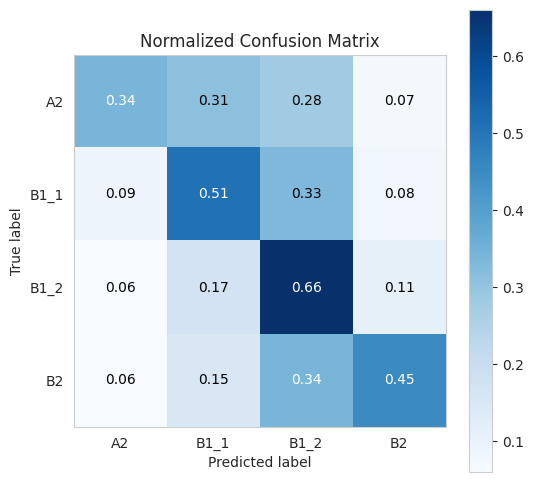

In [15]:
skplt.metrics.plot_confusion_matrix(y_pred, le.inverse_transform(preds["LogRegr l2 saga"]), normalize=True, hide_zeros=True, figsize=(6, 6));